# План анализа и построения baseline-моделей

## 1. Загрузка и первичная проверка данных
- Импорт библиотек, чтение train/test.
- Просмотр структуры DICOM-метаданных и признаков изображения.

## 2. Анализ и подготовка категориальных метаданных
- Исследование категорий (`sex_cat`, Source AET, Implementation Version).
- Оценка доли аномалий внутри категорий.
- Выявление редких и неинформативных классов.
- Кодирование: One-Hot Encoding для всех категориальных полей.
- Преобразование возраста: биннинг + ordinal (`age_ord`).
- Удаление слабых технических DICOM-метаданных.

## 3. Анализ простых визуальных признаков (GLCM, LBP, intensity)
- Корреляции с target.
- Краткие выводы, какие фичи действительно полезны.

## 4. Обработка HOG-признаков (высокая размерность)
- Отделение HOG-фичей от остальных.
- Масштабирование (StandardScaler).
- PCA (randomized SVD) → сжатие до ~200 компонент.
- Построение cumulative explained variance.
- Объединение PCA-фич с остальными признаками.


## 5. Logistic Regression (Baseline #1)
- Подбор C на inner-валидации.
- Оценка качества на hold-out.
- Feature importance (коэффициенты).
- Ошибки по классам патологий.
- Сохранение модели / scaler / feature list.

## 6. SVM (Baseline #2)
- Подбор C на inner-валидации.
- Calibrated probabilities (CalibratedClassifierCV).
- Оценка качества и баланс ошибок.
- Ошибки по классам.
- Feature importance для линейного SVM.
- Сохранение модели и метаданных.

## 7. Random Forest (Baseline #3)
- Grid-search по n_estimators.
- Итоговые метрики.
- Feature importance (Gini).
- Ошибки по классам.
- Сохранение модели.

## 8. XGBoost (Baseline #4)
- Подбор n_estimators / max_depth / learning_rate.
- Hold-out метрики.
- Feature importance (Gain / Weight).
- Ошибки по классам.
- Сохранение модели.
- 
## 9. Итоговые выводы

### 9.1. Ключевая метрика

Главная метрика — F1, так как данные несбалансированы и важно совместно контролировать recall (не пропускать патологии) и precision (не создавать лишних тревог).
ROC-AUC и recall класса 1 используются как вспомогательные.

⸻

### 9.2. Качество моделей и чувствительность к патологиям

Базовые модели дают стабильные результаты: F1 ≈ 0.88–0.90, ROC-AUC ≈ 0.97–0.984.
Общая тенденция одинакова:
	•	Лучше всего распознаются крупные и заметные патологии (Aortic enlargement, Cardiomegaly, Effusion).
	•	Хуже всего — мелкие и subtle (Nodule/Mass, ILD, Other lesion).

То есть классификация не «угадывает», а действительно реагирует на тип поражения.

### 9.3. Роль метаданных: плюсы и минусы

Все модели чувствительно зависят от метаданных снимка DICOM (тип консоли, версия ПО, пол, возраст):

Плюсы:
	•	Дают высокий F1 внутри текущего набора.
	•	Частично отражают «клинический контекст»: разные аппараты применяются для разных групп пациентов.

Минусы:
	•	Возникает hospital/scanner bias — модель может учить особенности конкретной больницы, а не изображений.
	•	При переносе на другой источник данные могут резко «просесть».

Метаданные дают прирост качества, но уменьшают универсальность. В рамках бинарной классификации считаю допустимым их использование, и скорее всего в задаче детекции от них не будет пользы. 

Как вариант- есть опция сравнить те же самые модели с метаданными и без них

### 9.4. Лучший baseline

Хотя XGBoost даёт наибольший F1, лучший baseline — Logistic Regression:
она интерпретируема, проста, меньше переобучается и идеально подходит для точки отсчёта перед DL-моделями.

⸻

### 9.5. Следующие шаги

После бинарной классификации логично перейти к детекции и локализации аномалий:
bounding boxes, размер очага, несколько поражений на одном снимке, классификация каждого поля.

⸻

### 9.6. Как это помогает дальнейшему DL

Анализ табличных моделей даёт важные выводы для будущих CNN/Transformer моделей:
	•	известно, какие патологии самые трудные → на них сосредотачивать аугментации и разметку;
	•	видно, что текстурные признаки важны, значит DL-модель должна хорошо работать с мелкими паттернами;
	•	высокий вес метаданных напоминает о необходимости контролировать переносимость и строить пайплайн, ориентированный на изображение, а не на клинику.

Итог: модели дают сильный baseline, объясняют структуру данных и помогают правильно задать направление для будущей полноценной DL-системы.

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.decomposition import PCA

from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

from sklearn.metrics import (
    f1_score,
    precision_score,
    recall_score,
    roc_auc_score,
    average_precision_score,
    classification_report,
    confusion_matrix,
    roc_curve,
    precision_recall_curve
)
import os
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import pandas as pd
import numpy as np
import pydicom
from matplotlib.colors import hsv_to_rgb
from matplotlib.lines import Line2D

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import f1_score, precision_score, recall_score, roc_auc_score
from sklearn.metrics import classification_report, confusion_matrix



import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report, confusion_matrix
import joblib
import os

from sklearn.svm import LinearSVC
from sklearn.metrics import f1_score, precision_score, recall_score, roc_auc_score
from sklearn.calibration import CalibratedClassifierCV


import numpy as np
import pandas as pd
import os
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import (
    f1_score, precision_score, recall_score, roc_auc_score,
    classification_report, confusion_matrix
)
from sklearn.ensemble import RandomForestClassifier
import matplotlib.pyplot as plt
import joblib
import json
import pydicom
import matplotlib.patches as patches
from matplotlib.colors import hsv_to_rgb
from matplotlib.lines import Line2D

import numpy as np
import pandas as pd
import os
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import (
    f1_score, precision_score, recall_score, roc_auc_score,
    classification_report, confusion_matrix
)
import matplotlib.pyplot as plt
import joblib
import json
import pydicom
import matplotlib.patches as patches
from matplotlib.colors import hsv_to_rgb
from matplotlib.lines import Line2D
from xgboost import XGBClassifier

import numpy as np
import pandas as pd
import os
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import (
    f1_score, precision_score, recall_score, roc_auc_score,
    classification_report, confusion_matrix
)
import matplotlib.pyplot as plt
import joblib
import json
import pydicom
import matplotlib.patches as patches
from matplotlib.colors import hsv_to_rgb
from matplotlib.lines import Line2D
from xgboost import XGBClassifier



## I. Импорт и загрузка данных


In [4]:
pd.set_option("display.max_columns", 120)

# Загружаем финальный датасет с метаданными + фичами изображений
df = pd.read_csv("train_full_dataset.csv")

print("Shape:", df.shape)
df.head()

Shape: (15000, 8134)


,filename_meta,Rows,Columns,Window Center,Window Width,Source Application Entity Title,Implementation Version Name,px_sp_x,px_sp_y,age,sex_cat,image_id,target_binary,mean_intensity,std_intensity,min_intensity,max_intensity,glcm_contrast,glcm_dissimilarity,glcm_homogeneity,glcm_energy,glcm_correlation,glcm_asm,hog_0,hog_1,hog_2,hog_3,hog_4,hog_5,hog_6,hog_7,hog_8,hog_9,hog_10,hog_11,hog_12,hog_13,hog_14,hog_15,hog_16,hog_17,hog_18,hog_19,hog_20,hog_21,hog_22,hog_23,hog_24,hog_25,hog_26,hog_27,hog_28,hog_29,hog_30,hog_31,hog_32,hog_33,hog_34,hog_35,hog_36,...,hog_8051,hog_8052,hog_8053,hog_8054,hog_8055,hog_8056,hog_8057,hog_8058,hog_8059,hog_8060,hog_8061,hog_8062,hog_8063,hog_8064,hog_8065,hog_8066,hog_8067,hog_8068,hog_8069,hog_8070,hog_8071,hog_8072,hog_8073,hog_8074,hog_8075,hog_8076,hog_8077,hog_8078,hog_8079,hog_8080,hog_8081,hog_8082,hog_8083,hog_8084,hog_8085,hog_8086,hog_8087,hog_8088,hog_8089,hog_8090,hog_8091,hog_8092,hog_8093,hog_8094,hog_8095,hog_8096,hog_8097,hog_8098,hog_8099,lbp_0,lbp_1,lbp_2,lbp_3,lbp_4,lbp_5,lbp_6,lbp_7,lbp_8,lbp_9,lbp_10
0,000434271f63a053c4128a0ba6352c7f,2836,2336,2047.0,4095.0,VITREA1,Unknown,0.150,0.150,NaN,Unknown,000434271f63a053c4128a0ba6352c7f,0,0.586675,0.302469,0.000000,0.998964,77.032322,3.760570,0.378617,0.069327,0.993497,0.004806,0.057076,0.015574,0.028788,0.022528,0.703891,0.000000,0.000000,0.000000,0.000000,0.042782,0.004640,0.017704,0.024153,0.703891,0.002115,0.000242,0.000000,0.000000,0.015712,0.023124,0.013788,0.004664,0.004799,0.001002,0.000744,0.000341,0.007743,0.008307,0.013025,0.010649,0.005451,0.003694,0.001195,0.000893,0.001015,0.003154,0.051435,...,0.026534,0.007487,0.027904,0.088310,0.469040,0.469040,0.106548,0.025426,0.026910,0.037107,0.012809,0.011626,0.070998,0.445307,0.110359,0.022665,9.702151e-03,4.974926e-03,0.019440,0.020299,0.044190,0.157451,0.445307,0.000000,0.000000,0.000000,0.000074,0.000000,0.000000,0.000006,0.001396,0.445307,0.268744,0.051698,0.012337,0.013057,0.018005,0.006215,0.005641,0.034449,0.445307,0.000023,0.000000,0.000000,0.000065,0.000013,0.000016,0.000088,0.299433,0.018097,0.044159,0.031570,0.097031,0.292770,0.182449,0.069550,0.049393,0.148758,0.066223,0.0
1,00053190460d56c53cc3e57321387478,2430,1994,2047.0,4096.0,VITREA1,Unknown,0.175,0.175,NaN,Unknown,00053190460d56c53cc3e57321387478,0,0.581661,0.301459,0.001732,1.000000,33.394301,2.901593,0.435761,0.076440,0.997164,0.005843,0.101098,0.039170,0.023223,0.037401,0.009606,0.000147,0.001934,0.019359,0.062391,0.041557,0.009559,0.010052,0.017923,0.000293,0.000524,0.002559,0.033548,0.039681,0.032971,0.002164,0.000793,0.011962,0.060841,0.016280,0.019400,0.045112,0.124681,0.005728,0.000480,0.000206,0.840134,0.495587,0.021110,0.018115,0.033604,0.021650,0.006322,...,0.001576,0.001443,0.010839,0.012362,0.473293,0.473293,0.042682,0.000326,0.000000,0.000000,0.000000,0.000000,0.007078,0.398289,0.398289,0.050963,3.171144e-03,2.107824e-03,0.005289,0.004863,0.006364,0.006352,0.398289,0.398289,0.000575,0.000376,0.000378,0.000065,0.000083,0.000083,0.000434,0.398289,0.398289,0.031236,0.000238,0.000000,0.000000,0.000000,0.000000,0.005180,0.197305,0.074255,0.000620,0.000138,0.000117,0.000061,0.000091,0.000332,0.002182,0.008163,0.028946,0.020569,0.096344,0.319107,0.220474,0.061096,0.046875,0.159897,0.038528,0.0
2,0005e8e3701dfb1dd93d53e2ff537b6e,3072,3072,8483.0,11160.0,Unknown,OFFIS_DCMTK_360,0.140,0.140,28.0,F,0005e8e3701dfb1dd93d53e2ff537b6e,1,0.473378,0.200817,0.000142,0.989215,62.927619,3.471369,0.436753,0.125527,0.987797,0.015757,0.411632,0.000000,0.059286,0.044058,0.411632,0.000215,0.000017,0.000000,0.292673,0.000203,0.000045,0.000054,0.000411,0.411632,0.001307,0.000190,0.000166,0.000240,0.411632,0.009037,0.001535,0.000294,0.001039,0.001253,0.016767,0.024340,0.242632,0.000002,0.004487,0.013251,0.411632,0.039016,0.011014,0.002791,0.000000,0.000000,0.000197,...,0.007552,0.118938,0.088220,0.008394,0.009971,0.520481,0.150131,0.009745,0.520481,0.342497,0.043854,0.053895,0.000000,0.000289,0.000544,0.000203,6.614115

target_binary
0    0.707067
1    0.292933
Name: proportion, dtype: float64


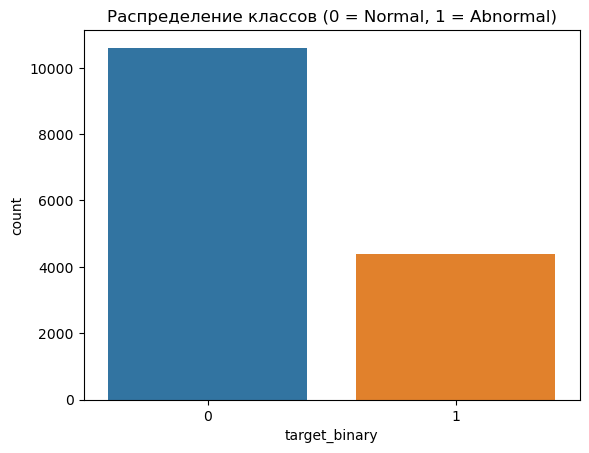

TOP 20 колонок по доле пропусков:
age              0.749333
px_sp_x          0.143467
px_sp_y          0.143467
Window Center    0.028200
Window Width     0.028200
filename_meta    0.000000
hog_5404         0.000000
hog_5399         0.000000
hog_5400         0.000000
hog_5401         0.000000
hog_5402         0.000000
hog_5403         0.000000
hog_5407         0.000000
hog_5405         0.000000
hog_5406         0.000000
hog_5397         0.000000
hog_5408         0.000000
hog_5409         0.000000
hog_5410         0.000000
hog_5398         0.000000
dtype: float64


In [5]:
# Проверяем наличие целевой переменной
assert "target_binary" in df.columns, "Не найден столбец target_binary"

print(df["target_binary"].value_counts(normalize=True))
sns.countplot(data=df, x="target_binary")
plt.title("Распределение классов (0 = Normal, 1 = Abnormal)")
plt.show()

# Пропуски
missing = df.isna().mean().sort_values(ascending=False)
print("TOP 20 колонок по доле пропусков:")
print(missing.head(20))

In [6]:
df[["filename_meta", "image_id"]]

,filename_meta,image_id
0,000434271f63a053c4128a0ba6352c7f,000434271f63a053c4128a0ba6352c7f
1,00053190460d56c53cc3e57321387478,00053190460d56c53cc3e57321387478
2,0005e8e3701dfb1dd93d53e2ff537b6e,0005e8e3701dfb1dd93d53e2ff537b6e
3,0006e0a85696f6bb578e84fafa9a5607,0006e0a85696f6bb578e84fafa9a5607
4,0007d316f756b3fa0baea2ff514ce945,0007d316f756b3fa0baea2ff514ce945
...,...,...
14995,ffe6f9fe648a7ec29a50feb92d6c15a4,ffe6f9fe648a7ec29a50feb92d6c15a4
14996,ffea246f04196af602c7dc123e5e48fc,ffea246f04196af602c7dc123e5e48fc
14997,ffeffc54594debf3716d6fcd2402a99f,ffeffc54594debf3716d6fcd2402a99f
14998,fff0f82159f9083f3dd1f8967fc54f6a,fff0f82159f9083f3dd1f8967fc54f6a


In [7]:
# === Удаляем ID-поля, которые не должны участвовать в анализе ===
drop_cols = ["filename_meta"]
df = df.drop(columns=[c for c in drop_cols if c in df.columns])

In [8]:
df.sample(3)

,Rows,Columns,Window Center,Window Width,Source Application Entity Title,Implementation Version Name,px_sp_x,px_sp_y,age,sex_cat,image_id,target_binary,mean_intensity,std_intensity,min_intensity,max_intensity,glcm_contrast,glcm_dissimilarity,glcm_homogeneity,glcm_energy,glcm_correlation,glcm_asm,hog_0,hog_1,hog_2,hog_3,hog_4,hog_5,hog_6,hog_7,hog_8,hog_9,hog_10,hog_11,hog_12,hog_13,hog_14,hog_15,hog_16,hog_17,hog_18,hog_19,hog_20,hog_21,hog_22,hog_23,hog_24,hog_25,hog_26,hog_27,hog_28,hog_29,hog_30,hog_31,hog_32,hog_33,hog_34,hog_35,hog_36,hog_37,...,hog_8051,hog_8052,hog_8053,hog_8054,hog_8055,hog_8056,hog_8057,hog_8058,hog_8059,hog_8060,hog_8061,hog_8062,hog_8063,hog_8064,hog_8065,hog_8066,hog_8067,hog_8068,hog_8069,hog_8070,hog_8071,hog_8072,hog_8073,hog_8074,hog_8075,hog_8076,hog_8077,hog_8078,hog_8079,hog_8080,hog_8081,hog_8082,hog_8083,hog_8084,hog_8085,hog_8086,hog_8087,hog_8088,hog_8089,hog_8090,hog_8091,hog_8092,hog_8093,hog_8094,hog_8095,hog_8096,hog_8097,hog_8098,hog_8099,lbp_0,lbp_1,lbp_2,lbp_3,lbp_4,lbp_5,lbp_6,lbp_7,lbp_8,lbp_9,lbp_10
3386,2430,1994,2047.0,4096.0,VITREA1,Unknown,0.175,0.175,NaN,M,39a214070b37dac5d899b7079e046ee5,0,0.555205,0.299937,0.000496,0.991050,42.436137,3.251700,0.412828,0.096810,0.996369,0.009372,0.307262,0.226272,0.224541,0.205819,0.090795,0.002313,0.008370,0.107028,0.307262,0.307262,0.094006,0.126362,0.144745,0.022988,0.001729,0.033926,0.183938,0.307262,0.307262,0.088501,0.007394,0.000000,0.017420,0.003398,0.018471,0.121830,0.307262,0.133759,0.043341,0.005838,0.006505,0.012437,0.019992,0.089012,0.205903,0.307262,0.287708,0.133825,...,0.050522,0.035545,0.075366,0.188542,0.253675,0.253675,0.184848,0.179976,0.122489,0.069781,0.097328,0.100451,0.187833,0.120862,0.064664,0.021338,0.066477,0.135567,0.191151,0.168294,0.148591,0.155478,0.377724,0.195973,0.057135,0.034268,0.107703,0.049782,0.054841,0.118503,0.377724,0.193307,0.150641,0.105081,0.102311,0.069631,0.039669,0.055328,0.057103,0.106778,0.377724,0.377724,0.042108,0.031039,0.069133,0.018091,0.057611,0.133463,0.259769,0.011871,0.034821,0.028442,0.099777,0.292557,0.217560,0.064041,0.047165,0.158493,0.045273,0.0
14517,2836,2336,2047.0,4095.0,VITREA1,Unknown,0.150,0.150,NaN,Unknown,f6acae0f3d3d5333c6ccb5dd5b896153,0,0.646809,0.238647,0.000371,0.999819,45.835631,4.094301,0.296406,0.024550,0.993753,0.000603,0.006615,0.000000,0.141135,0.414325,0.414325,0.128742,0.017299,0.027503,0.000000,0.030856,0.018516,0.033797,0.131383,0.414325,0.287990,0.054777,0.006884,0.012380,0.019665,0.046305,0.084510,0.154953,0.259637,0.065542,0.022435,0.008579,0.012486,0.013193,0.027560,0.036434,0.061511,0.122321,0.241826,0.346902,0.164895,0.091823,0.026953,0.016174,...,0.214525,0.247783,0.106205,0.081683,0.310490,0.097334,0.029755,0.057312,0.041288,0.095205,0.160432,0.272811,0.310490,0.381359,0.067906,0.030707,0.027027,0.026690,0.086895,0.335464,0.141823,0.058798,0.381359,0.000000,0.000000,0.000000,0.000316,0.000000,0.000000,0.000000,0.381359,0.234035,0.043713,0.013363,0.025739,0.018543,0.042757,0.072051,0.122521,0.202995,0.381359,0.007526,0.000000,0.000000,0.000262,0.000000,0.000000,0.031761,0.381359,0.018799,0.041626,0.037064,0.112671,0.322174,0.229446,0.074173,0.046204,0.055191,0.062653,0.0
388,2430,1994,2047.0,4096.0,VITREA1,Unknown,0.175,0.175,NaN,Unknown,06c03e3939bd4349223c84fc98cb96b1,0,0.615299,0.296623,0.001396,0.969863,28.925061,2.664185,0.458591,0.058336,0.997459,0.003403,0.004614,0.002578,0.001862,0.023032,0.012646,0.004424,0.001413,0.001346,0.001848,0.001909,0.000775,0.001046,0.055009,0.161981,0.026609,0.001081,0.000605,0.001249,0.000313,0.000000,0.036372,0.552518,0.158335,0.000139,0.000133,0.000211,0.000000,0.000000,0.005130,0.036317,0.552518,0.552518,0.155077,0.034024,0.014257,0.017145,0.001819,0.000738,...,0.012173,0.047286,0.116597,0.196803,0.139127,0.061811,0.028787,0.037231,0.018392,0.010148,0.018185,0.120150,0.501013,0.406863,0.020634,0.004416,0.002340,0.007833,0.007180,0.011672,0.016374,0.325318,0.406863,0.000070,0.000000,0.000000,0.000073,0.000

## II. Обработка метаданных изображения
применим методику работы с категориальными переменными, которая будет достаточно универсальной для каждой из бейслайн-моделей

Категориальные признаки: ['sex_cat', 'Source Application Entity Title', 'Implementation Version Name']

=== sex_cat: распределение категорий ===


,count
sex_cat,
Unknown,7646
M,3840
F,3514



=== Source Application Entity Title: распределение категорий ===


,count
Source Application Entity Title,
VITREA1,6266
Unknown,6079
TITAN,839
Samsung,774
Eleva,660
console5800,382



=== Implementation Version Name: распределение категорий ===


,count
Implementation Version Name,
Unknown,6266
OFFIS_DCMTK_360,6078
INF_3.9,2652
INF_4.5,3
dcm4che-1.4.34,1



=== sex_cat: доля target=1 в каждой категории ===


,sex_cat,target_mean
0,F,0.550939
1,M,0.504687
2,Unknown,0.068009


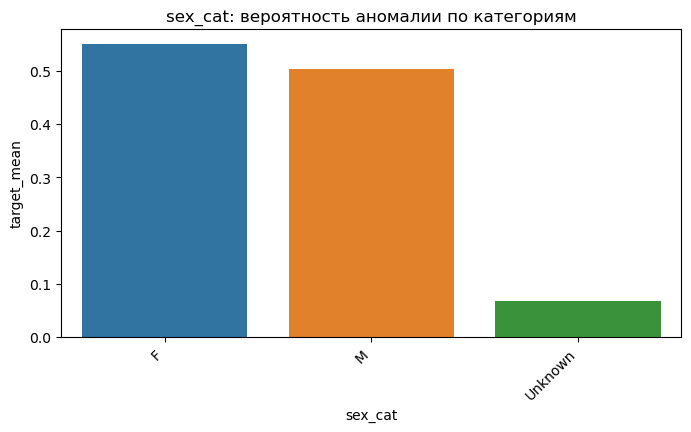


=== Source Application Entity Title: доля target=1 в каждой категории ===


,Source Application Entity Title,target_mean
3,Unknown,0.682020
2,TITAN,0.139452
0,Eleva,0.103030
5,console5800,0.073298
1,Samsung,0.045220
4,VITREA1,0.000000


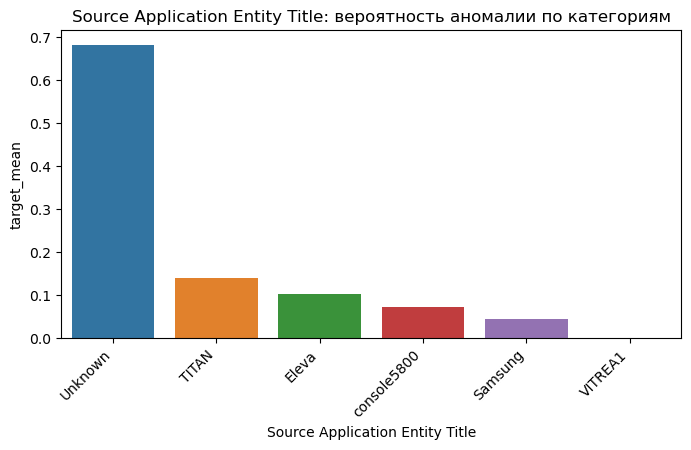


=== Implementation Version Name: доля target=1 в каждой категории ===


,Implementation Version Name,target_mean
4,dcm4che-1.4.34,1.000000
2,OFFIS_DCMTK_360,0.681968
1,INF_4.5,0.333333
0,INF_3.9,0.093137
3,Unknown,0.000000


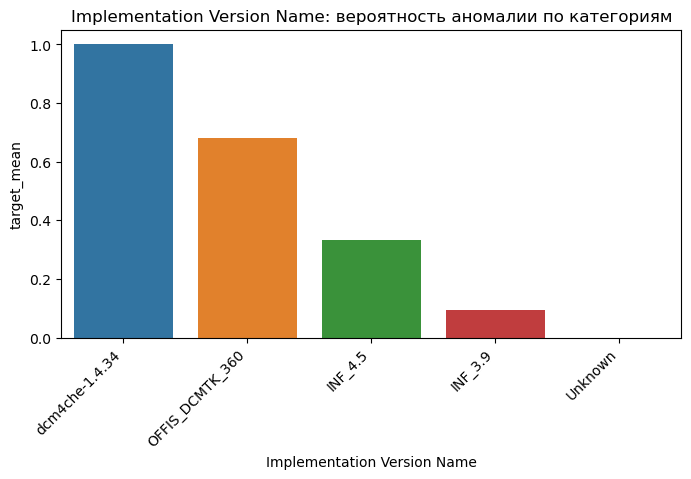


=== Анализ 'sex_cat' для выбора кодирования ===
- уникальных значений: 3
- редкие (<1%) категории: 0 шт.
- топ-5 категорий: ['Unknown', 'M', 'F']
- упорядоченность категорий по target: True
→ РЕКОМЕНДАЦИЯ: One-Hot Encoding (мало классов).

=== Анализ 'Source Application Entity Title' для выбора кодирования ===
- уникальных значений: 6
- редкие (<1%) категории: 0 шт.
- топ-5 категорий: ['VITREA1', 'Unknown', 'TITAN', 'Samsung', 'Eleva']
- упорядоченность категорий по target: False
→ РЕКОМЕНДАЦИЯ: Target Encoding или One-Hot c обработкой редких классов.

=== Анализ 'Implementation Version Name' для выбора кодирования ===
- уникальных значений: 5
- редкие (<1%) категории: 2 шт.
- топ-5 категорий: ['Unknown', 'OFFIS_DCMTK_360', 'INF_3.9', 'INF_4.5', 'dcm4che-1.4.34']
- упорядоченность категорий по target: False
→ РЕКОМЕНДАЦИЯ: One-Hot Encoding (мало классов).


In [10]:
categorical_cols = ["sex_cat", 
                    "Source Application Entity Title", 
                    "Implementation Version Name"]

target = "target_binary"

print("Категориальные признаки:", categorical_cols)

# ============================================
# 1) Распределение категорий + количество
# ============================================
for col in categorical_cols:
    print(f"\n=== {col}: распределение категорий ===")
    display(df[[col]].value_counts(dropna=False).rename("count").to_frame())

# ============================================
# 2) Доля 'abnormal' внутри каждой категории
# ============================================
for col in categorical_cols:
    print(f"\n=== {col}: доля target=1 в каждой категории ===")
    tmp = (
        df.groupby(col)[target]
          .mean()
          .rename("target_mean")
          .reset_index()
          .sort_values("target_mean", ascending=False)
    )
    display(tmp)

    # график
    plt.figure(figsize=(8,4))
    sns.barplot(data=tmp, x=col, y="target_mean")
    plt.xticks(rotation=45, ha="right")
    plt.title(f"{col}: вероятность аномалии по категориям")
    plt.show()

# ============================================
# 3) Частота категорий + F1-информативность
# ============================================
for col in categorical_cols:
    print(f"\n=== Анализ '{col}' для выбора кодирования ===")
    vc = df[col].value_counts(normalize=True)
    rare_classes = vc[vc < 0.01].index.tolist()

    print(f"- уникальных значений: {df[col].nunique()}")
    print(f"- редкие (<1%) категории: {len(rare_classes)} шт.")
    print(f"- топ-5 категорий: {list(vc.head(5).index)}")

    # Проверка монотонности → подходит ли ordinal encoding
    means = df.groupby(col)[target].mean().values
    is_monotonic = (np.all(np.diff(means) >= 0) or np.all(np.diff(means) <= 0))

    print(f"- упорядоченность категорий по target: {is_monotonic}")

    # Рекомендации
    if df[col].nunique() <= 5:
        print("→ РЕКОМЕНДАЦИЯ: One-Hot Encoding (мало классов).")
    elif is_monotonic:
        print("→ РЕКОМЕНДАЦИЯ: Ordinal Encoding (категории можно упорядочить).")
    else:
        print("→ РЕКОМЕНДАЦИЯ: Target Encoding или One-Hot c обработкой редких классов.")

### возраст хорошо кореллирует с аномалиями, однако слишком много пропущенных значений в трейне и в тесте
посмотрим, что выходит по пропущенным значениям

=== Анализ 'age' и связи с target_binary ===
Доля пропусков: 0.749

Общая статистика по возрасту:


count    3760.000000
mean       54.379521
std        17.590789
min         2.000000
25%        42.000000
50%        57.000000
75%        67.000000
max        98.000000
Name: age, dtype: float64


Статистика по группам target_binary:


,count,mean,std,min,25%,50%,75%,max
target_binary,,,,,,,,
0,1194.0,39.589615,14.651839,2.0,30.0,38.0,50.0,83.0
1,2566.0,61.261496,14.297774,2.0,54.0,62.0,70.0,98.0


/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


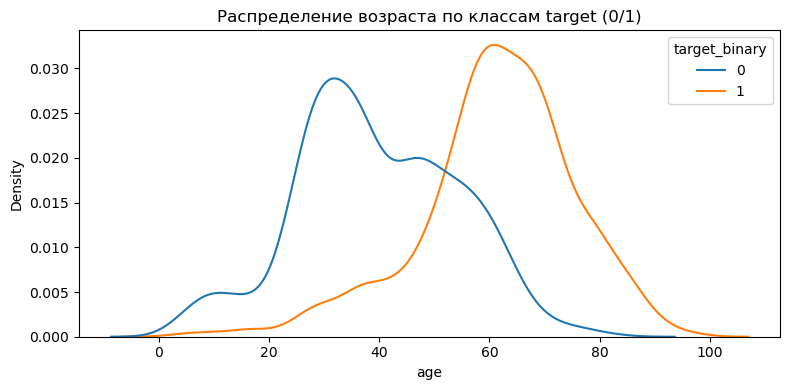


Уникальные категории age_bin: Index(['Unknown', '[0,20)', '[20,30)', '[30,40)', '[40,50)', '[50,60)',
       '[60,70)', '[70,80)', '[80,120)'],
      dtype='object')
    age  age_bin
0   NaN  Unknown
1   NaN  Unknown
2  28.0  [20,30)
3   NaN  Unknown
4   NaN  Unknown

Доля abnormal по возрастным категориям:


,abnormal_rate,count
age_bin,,
Unknown,0.162633,11240
"[20,30)",0.207692,260
"[0,20)",0.237288,118
"[30,40)",0.275210,476
"[40,50)",0.457944,428
"[50,60)",0.756272,837
"[60,70)",0.892625,922
"[70,80)",0.969199,487
"[80,120)",0.987069,232


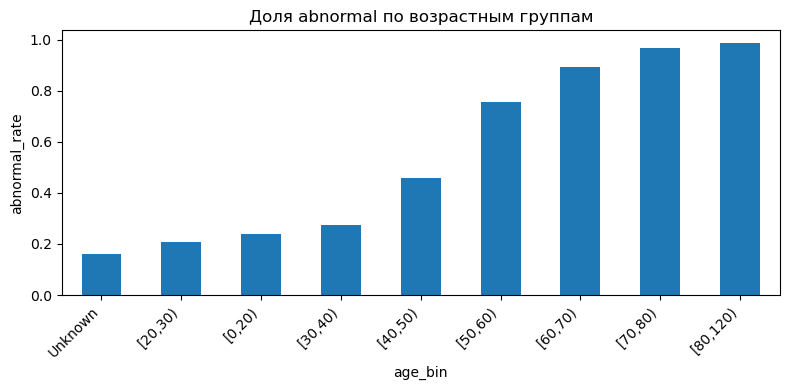


=== Рекомендация по кодированию возрастного признака ===
- возрастные категории: ['Unknown', '[0,20)', '[20,30)', '[30,40)', '[40,50)', '[50,60)', '[60,70)', '[70,80)', '[80,120)']
- число категорий: 9
- пропуски вынесены в отдельную категорию 'Unknown'
→ РЕКОМЕНДАЦИЯ: Ordinal Encoding, т.к. зависимость монотонная.


In [12]:
# === Анализ связи возраста с target ===

col = "age"

print(f"=== Анализ '{col}' и связи с target_binary ===")
print(f"Доля пропусков: {df[col].isna().mean():.3f}")

print("\nОбщая статистика по возрасту:")
display(df[col].describe())

print("\nСтатистика по группам target_binary:")
display(
    df.groupby("target_binary")[col]
      .describe()[["count", "mean", "std", "min", "25%", "50%", "75%", "max"]]
)

# --- KDE график возраста для healthy vs abnormal ---
plt.figure(figsize=(8,4))
sns.kdeplot(data=df, x=col, hue="target_binary", common_norm=False)
plt.title("Распределение возраста по классам target (0/1)")
plt.xlabel("age")
plt.tight_layout()
plt.show()


# ============================================================
# ===  Биннинг возраста  + категория 'Unknown'  = age_bin   ===
# ============================================================

df_model = df.copy()

age_bins = [0, 20, 30, 40, 50, 60, 70, 80, 120]
age_labels = [
    "[0,20)", "[20,30)", "[30,40)", "[40,50)",
    "[50,60)", "[60,70)", "[70,80)", "[80,120)"
]

df_model["age_bin"] = pd.cut(
    df_model["age"],
    bins=age_bins,
    labels=age_labels,
    right=False,
    include_lowest=True
)

# пропуски → отдельная категория
df_model["age_bin"] = df_model["age_bin"].astype(object)
df_model.loc[df_model["age"].isna(), "age_bin"] = "Unknown"
df_model["age_bin"] = df_model["age_bin"].astype("category")

print("\nУникальные категории age_bin:", df_model["age_bin"].cat.categories)
print(df_model[["age", "age_bin"]].head())


# ============================================================
# ===  Доля abnormal в каждом возрастном интервале          ===
# ============================================================

age_bin_stats = (
    df_model
    .groupby("age_bin", observed=False)["target_binary"]
    .agg(["mean", "count"])
    .rename(columns={"mean": "abnormal_rate"})
    .sort_values("abnormal_rate")
)

print("\nДоля abnormal по возрастным категориям:")
display(age_bin_stats)

plt.figure(figsize=(8,4))
age_bin_stats["abnormal_rate"].plot(kind="bar")
plt.title("Доля abnormal по возрастным группам")
plt.ylabel("abnormal_rate")
plt.xticks(rotation=45, ha="right")
plt.tight_layout()
plt.show()


# ============================================================
# ===  РЕКОМЕНДАЦИЯ по кодированию признака age              ==
# ============================================================

print("\n=== Рекомендация по кодированию возрастного признака ===")

n_unique = df_model["age_bin"].nunique()

# Проверяем "монотонность" abnormal_rate по возрастным группам
ordered_rates = age_bin_stats["abnormal_rate"].values
is_monotonic = (
    (np.diff(ordered_rates) >= 0).all() or
    (np.diff(ordered_rates) <= 0).all()
)

print(f"- возрастные категории: {list(df_model['age_bin'].cat.categories)}")
print(f"- число категорий: {n_unique}")
print(f"- пропуски вынесены в отдельную категорию 'Unknown'")

if n_unique <= 5:
    print("→ РЕКОМЕНДАЦИЯ: One-Hot Encoding (мало бакетов).")
elif is_monotonic:
    print("→ РЕКОМЕНДАЦИЯ: Ordinal Encoding, т.к. зависимость монотонная.")
else:
    print("→ РЕКОМЕНДАЦИЯ: One-Hot Encoding (безопаснее) или Target Encoding.")

=== Анализ числовых технических метаданных ===
Используемые признаки: ['Rows', 'Columns', 'px_sp_x', 'px_sp_y', 'Window Center', 'Window Width']

=== Общая статистика ===


,count,mean,std,min,25%,50%,75%,max
Rows,15000.0,2786.866600,301.100076,927.000,2500.000,2847.000,3051.000,3408.0
Columns,15000.0,2446.286933,366.247726,823.000,2048.000,2388.000,2670.000,3320.0
px_sp_x,12848.0,0.148391,0.034764,0.125,0.139,0.143,0.168,1.0
px_sp_y,12848.0,0.148391,0.034764,0.125,0.139,0.143,0.168,1.0
Window Center,14577.0,5351.855732,7938.802871,0.000,2047.000,2048.000,7476.000,52667.0
Window Width,14577.0,9066.481992,14206.523963,1023.000,4095.000,4096.000,6451.000,65535.0



=== Корреляции с target_binary ===


target_binary    1.000000
Rows             0.126435
Columns          0.100124
Window Width    -0.064500
px_sp_x          0.020943
px_sp_y          0.020943
Window Center   -0.009879
Name: target_binary, dtype: float64

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


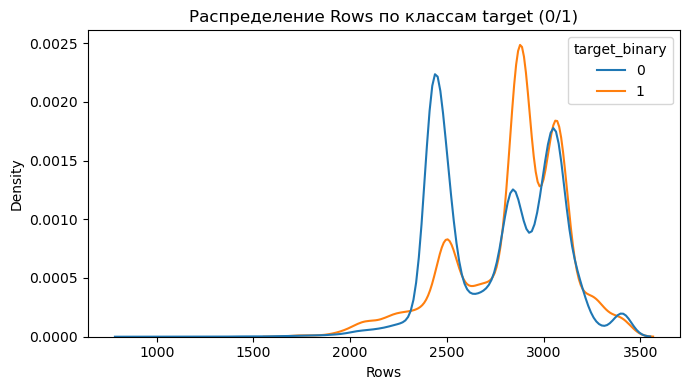

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


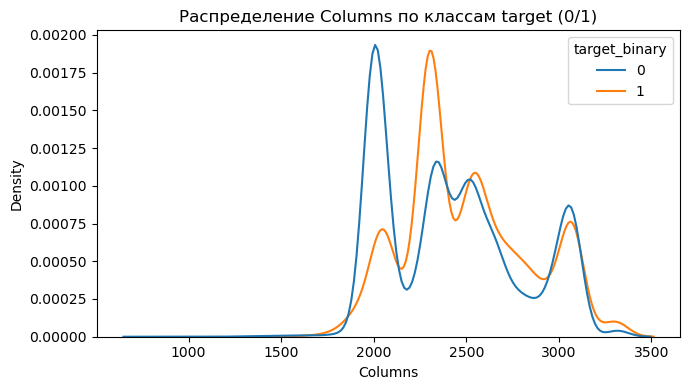

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


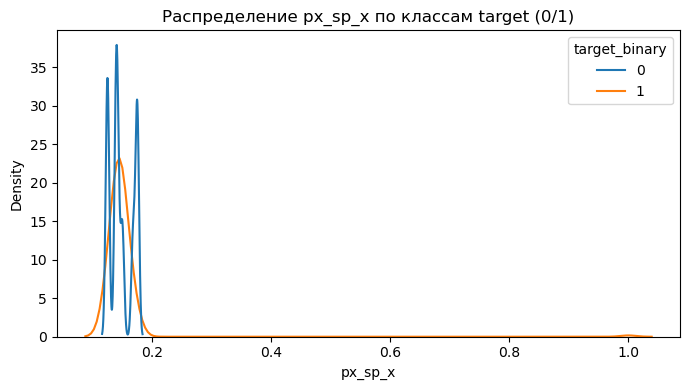

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


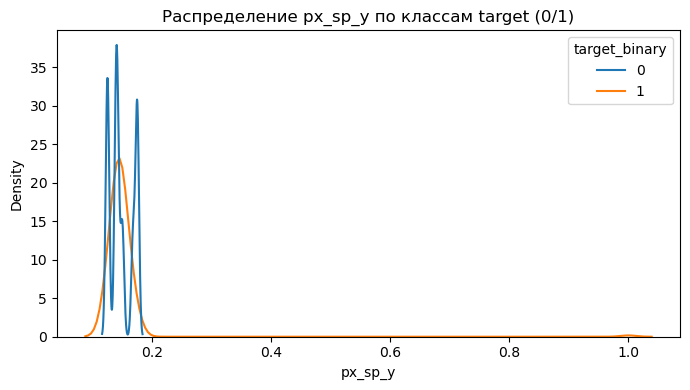

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


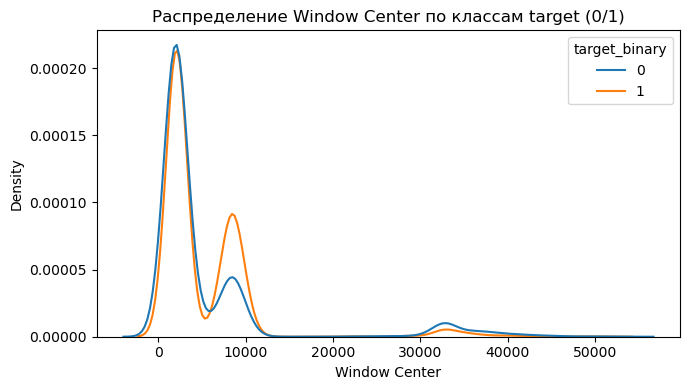

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


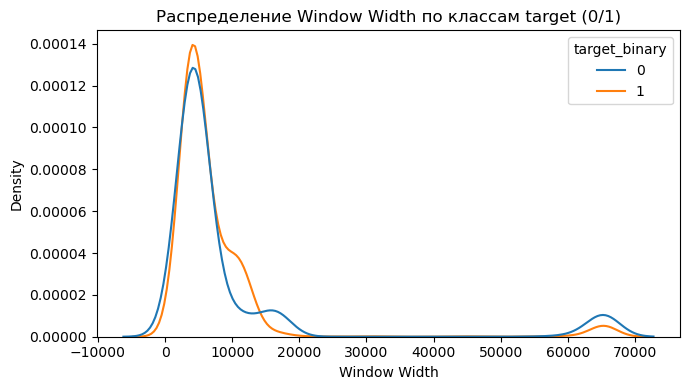

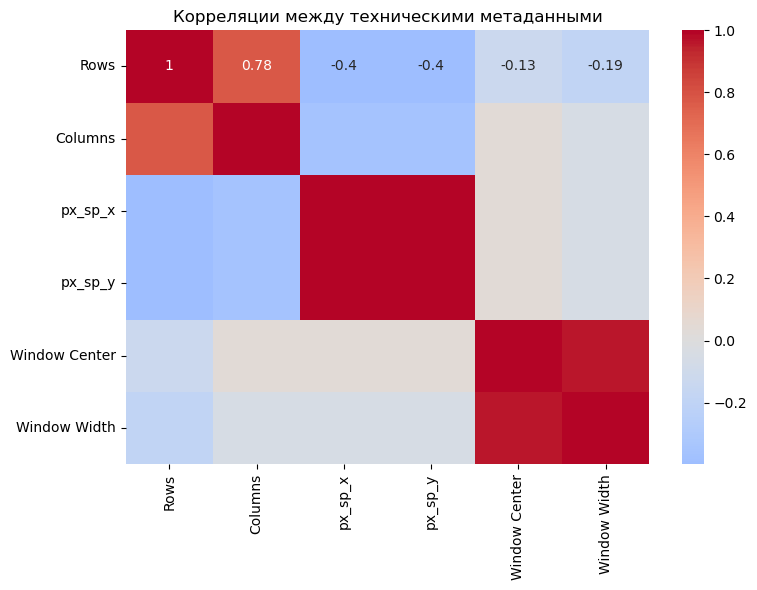


=== Короткие выводы ===
Rows                 corr=+0.1264   → слабая связь, можно оставить но большой пользы нет
Columns              corr=+0.1001   → слабая связь, можно оставить но большой пользы нет
px_sp_x              corr=+0.0209   → практически не связано с target
px_sp_y              corr=+0.0209   → практически не связано с target
Window Center        corr=-0.0099   → практически не связано с target
Window Width         corr=-0.0645   → слабая связь, можно оставить но большой пользы нет


In [13]:
# ОСТАВШИЕСЯ МЕТАДАННЫЕ (не категориальные)

numeric_meta_cols = [
    "Rows", "Columns",
    "px_sp_x", "px_sp_y",
    "Window Center", "Window Width"
]

print("=== Анализ числовых технических метаданных ===")
print("Используемые признаки:", numeric_meta_cols)

print("\n=== Общая статистика ===")
display(df[numeric_meta_cols].describe().T)

corr_values = df[numeric_meta_cols + ["target_binary"]].corr()["target_binary"].sort_values(
    key=lambda s: s.abs(), ascending=False
)

print("\n=== Корреляции с target_binary ===")
display(corr_values)


for col in numeric_meta_cols:
    plt.figure(figsize=(7,4))
    sns.kdeplot(data=df, x=col, hue="target_binary", common_norm=False)
    plt.title(f"Распределение {col} по классам target (0/1)")
    plt.tight_layout()
    plt.show()
    
# Heatmap технических метаданных
plt.figure(figsize=(8,6))
sns.heatmap(df[numeric_meta_cols].corr(), annot=True, cmap="coolwarm", center=0)
plt.title("Корреляции между техническими метаданными")
plt.tight_layout()
plt.show()

# Короткие выводы по информативности

print("\n=== Короткие выводы ===")

for col in numeric_meta_cols:
    corr_val = corr_values[col]
    if abs(corr_val) < 0.05:
        info = "→ практически не связано с target"
    elif abs(corr_val) < 0.15:
        info = "→ слабая связь, можно оставить но большой пользы нет"
    else:
        info = "→ умеренно полезно"

    print(f"{col:20s} corr={corr_val:+.4f}   {info}")

## в текущей реализации -допустимо выкинуть все метаданные, кроме категориальных и возрастных 

In [15]:
# ============================================================
# === AGE: binning + ordinal encoding ========================
# ============================================================
if "age_bin" not in df.columns:
    age_bins = [0, 20, 30, 40, 50, 60, 70, 80, 12000]
    age_labels = [
        "[0,20)", "[20,30)", "[30,40)", "[40,50)",
        "[50,60)", "[60,70)", "[70,80)", "[80,120)"
    ]

    df["age_bin"] = pd.cut(
        df["age"],
        bins=age_bins,
        labels=age_labels,
        right=False,
        include_lowest=True
    )

    # пропуски возраста → отдельная категория
    df["age_bin"] = df["age_bin"].astype(object)
    df.loc[df["age"].isna(), "age_bin"] = "Unknown"

df["age_bin"] = df["age_bin"].astype("category")


age_order = [
    "Unknown",
    "[0,20)", "[20,30)", "[30,40)", "[40,50)",
    "[50,60)", "[60,70)", "[70,80)", "[80,120)"
]
age_map = {cat: i for i, cat in enumerate(age_order)}

df["age_ord"] = df["age_bin"].map(age_map).astype("Int8")

print("\nУникальные age_bin → age_ord:")
print(df[["age_bin", "age_ord"]].drop_duplicates().sort_values("age_ord"))


# ============================================================
# === Categorical metadata: One-Hot Encoding =================
# ============================================================

cat_cols = [
    "sex_cat",
    "Source Application Entity Title",
    "Implementation Version Name",
]

# приведение типов
for c in cat_cols:
    if c in df.columns:
        df[c] = df[c].astype("category")

# создаём OHE
ohe = pd.get_dummies(
    df[cat_cols],
    prefix=["sex", "seat", "impl"],
    drop_first=False
)

print("\nOHE shape:", ohe.shape)
print("OHE columns:", ohe.columns.tolist())


# ============================================================
# === Final merge: добавляем OHE, удаляем оригиналы ==========
# ============================================================

cols_to_drop_after_encoding = cat_cols + ["age_bin", "age"]

df = pd.concat([df.drop(columns=cols_to_drop_after_encoding), ohe], axis=1)


# ============================================================
# === Удаляем слабые технические DICOM-метаданные ============
# ============================================================

weak_meta = [
    "Rows", "Columns", "px_sp_x", "px_sp_y",
    "Window Center", "Window Width",
]

drop_cols = [c for c in weak_meta if c in df.columns]
print("\nDropping weak meta columns:", drop_cols)
df = df.drop(columns=drop_cols)

print("\nFinal shape:", df.shape)


Уникальные age_bin → age_ord:
      age_bin  age_ord
0     Unknown        0
106    [0,20)        1
2     [20,30)        2
45    [30,40)        3
11    [40,50)        4
9     [50,60)        5
21    [60,70)        6
39    [70,80)        7
7    [80,120)        8

OHE shape: (15000, 14)
OHE columns: ['sex_F', 'sex_M', 'sex_Unknown', 'seat_Eleva', 'seat_Samsung', 'seat_TITAN', 'seat_Unknown', 'seat_VITREA1', 'seat_console5800', 'impl_INF_3.9', 'impl_INF_4.5', 'impl_OFFIS_DCMTK_360', 'impl_Unknown', 'impl_dcm4che-1.4.34']

Dropping weak meta columns: ['Rows', 'Columns', 'px_sp_x', 'px_sp_y', 'Window Center', 'Window Width']

Final shape: (15000, 8138)


## Обработка категориальных метаданных

Мы проанализировали и выделили ключевые категориальные метаданные

- `sex_cat` и `Implementation Version` → мало категорий → применили **One-Hot**.
- `Source AET` → 6 категорий без упорядоченности → также **One-Hot**.
- Возраст преобразован в интервалы (`age_bin`) и далее в **ordinal-признак** `age_ord`.

Почему это важно: такие параметры частично отражают **тип оборудования, больницу или профиль пациентов**, поскольку разные консоли/версии ПО используются в разных клинических случаях. Эти признаки дают сильный сигнал модели, поэтому мы кодируем их корректно, но сохраняем в данных.

## III. Обработка самих данных изображения, не HOG-признаков

Используем 21 простых признаков изображения
=== Корреляция простых признаков изображения с target ===


glcm_dissimilarity   -0.229177
glcm_contrast        -0.204773
glcm_homogeneity      0.200761
glcm_energy           0.188535
lbp_4                -0.184049
lbp_3                -0.169307
lbp_8                 0.158931
max_intensity        -0.152854
lbp_2                -0.151661
glcm_asm              0.148715
min_intensity         0.143747
lbp_7                 0.097292
glcm_correlation      0.091008
std_intensity        -0.050911
lbp_9                 0.050429
lbp_6                -0.039155
lbp_0                -0.037442
lbp_5                 0.030385
mean_intensity        0.024558
lbp_1                -0.018036
lbp_10                     NaN
Name: target_binary, dtype: float64

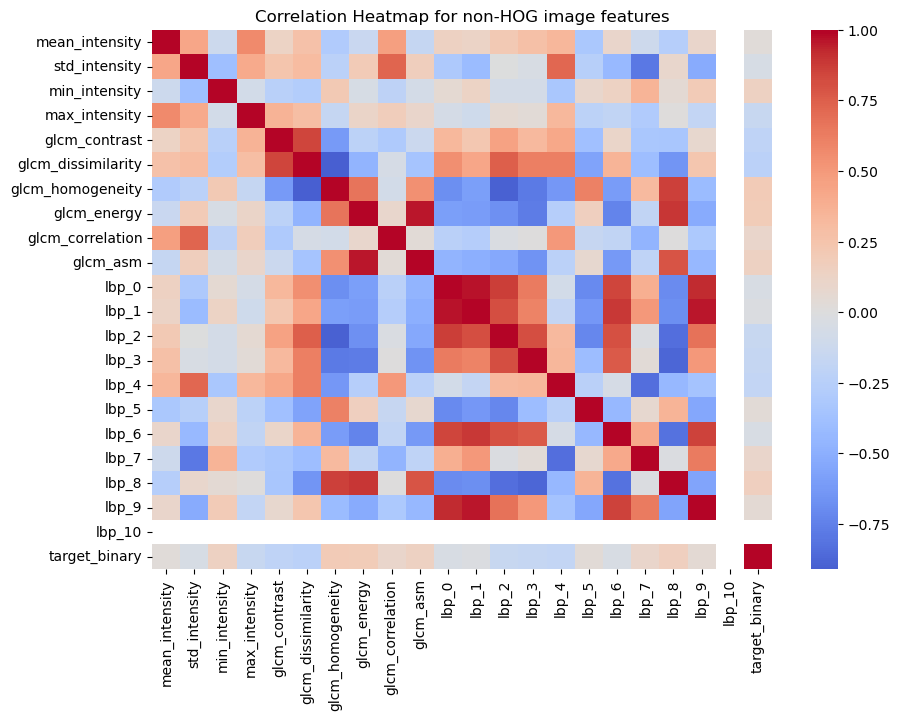

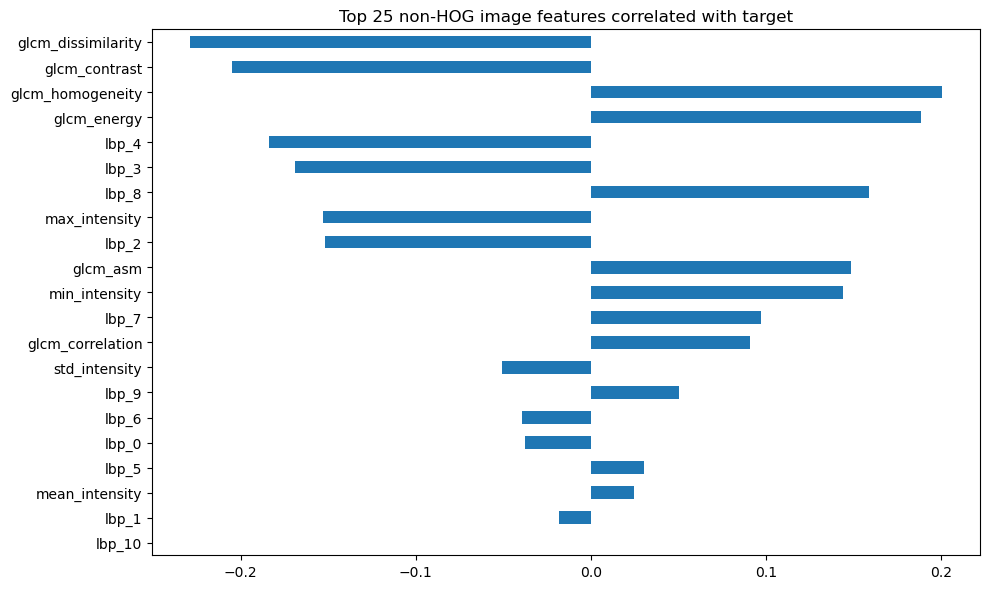

In [17]:
# === 1. Выделяем НЕ-HOG признаки изображений ===
simple_img_feats = [
    "mean_intensity",
    "std_intensity",
    "min_intensity",
    "max_intensity",
    "glcm_contrast",
    "glcm_dissimilarity",
    "glcm_homogeneity",
    "glcm_energy",
    "glcm_correlation",
    "glcm_asm",
] + [f"lbp_{i}" for i in range( len([c for c in df.columns if c.startswith("lbp_")]) )]


# фильтруем так, чтобы колонок не было отсутствующих
simple_img_feats = [c for c in simple_img_feats if c in df.columns]

print(f"Используем {len(simple_img_feats)} простых признаков изображения")

# === 2. Делаем корреляцию только с target ===
corr_series = (
    df[simple_img_feats + ["target_binary"]]
    .corr()["target_binary"]
    .drop(labels=["target_binary"])
    .sort_values(key=lambda x: x.abs(), ascending=False)
)

print("=== Корреляция простых признаков изображения с target ===")
display(corr_series)

# === 3. Heatmap для простых признаков ===
plt.figure(figsize=(10, 7))
sns.heatmap(
    df[simple_img_feats + ["target_binary"]].corr(),
    cmap="coolwarm",
    center=0,
    annot=False
)
plt.title("Correlation Heatmap for non-HOG image features")
plt.show()

# === 4. Бар-чарт топ-25 признаков ===
top_k = 25
plt.figure(figsize=(10, 6))
corr_series.head(top_k).plot(kind="barh")
plt.title(f"Top {top_k} non-HOG image features correlated with target")
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()

## Вывод по простым признакам изображения 
Анализ корреляций показывает, что часть изображенческих фич действительно несут осмысленную информацию о наличии патологии:

- **GLCM-признаки**:  
  `glcm_dissimilarity`, `glcm_contrast`, `glcm_homogeneity`, `glcm_energy`, `glcm_asm`  
  имеют заметную связь с целевой переменной (|corr| ≈ 0.15–0.23).  
  Это логично: патологии часто нарушают однородность и текстуру снимка.

- **LBP-признаки** (`lbp_2`, `lbp_3`, `lbp_4`, `lbp_8` и др.)  
  также показывают связь до |corr| ≈ 0.18 — текстура лёгочной ткани меняется при аномалиях.

- **Простые статистики интенсивности** (`min_intensity`, `max_intensity`)  
  дают небольшие, но устойчивые корреляции.

Хотя каждый отдельный признак обладает слабой предсказательной силой, **их совокупность способна давать полезный вклад в моделях**, особенно в тех, что учитывают нелинейные зависимости (XGBoost, Random Forest, SVM с RBF-ядром).

In [19]:
# список простых фич изображения (без HOG)
simple_img_cols = [
    "mean_intensity", "std_intensity", "min_intensity", "max_intensity",
    "glcm_contrast", "glcm_dissimilarity", "glcm_homogeneity",
    "glcm_energy", "glcm_correlation", "glcm_asm",
    "lbp_0", "lbp_1", "lbp_2", "lbp_3", "lbp_4",
    "lbp_5", "lbp_6", "lbp_7", "lbp_8", "lbp_9",
    # "lbp_10"  # выбрасываем
]

# выбрасываем проблемный признак
if "lbp_10" in df.columns:
    df = df.drop(columns=["lbp_10"])

In [20]:
df

,image_id,target_binary,mean_intensity,std_intensity,min_intensity,max_intensity,glcm_contrast,glcm_dissimilarity,glcm_homogeneity,glcm_energy,glcm_correlation,glcm_asm,hog_0,hog_1,hog_2,hog_3,hog_4,hog_5,hog_6,hog_7,hog_8,hog_9,hog_10,hog_11,hog_12,hog_13,hog_14,hog_15,hog_16,hog_17,hog_18,hog_19,hog_20,hog_21,hog_22,hog_23,hog_24,hog_25,hog_26,hog_27,hog_28,hog_29,hog_30,hog_31,hog_32,hog_33,hog_34,hog_35,hog_36,hog_37,hog_38,hog_39,hog_40,hog_41,hog_42,hog_43,hog_44,hog_45,hog_46,hog_47,...,hog_8065,hog_8066,hog_8067,hog_8068,hog_8069,hog_8070,hog_8071,hog_8072,hog_8073,hog_8074,hog_8075,hog_8076,hog_8077,hog_8078,hog_8079,hog_8080,hog_8081,hog_8082,hog_8083,hog_8084,hog_8085,hog_8086,hog_8087,hog_8088,hog_8089,hog_8090,hog_8091,hog_8092,hog_8093,hog_8094,hog_8095,hog_8096,hog_8097,hog_8098,hog_8099,lbp_0,lbp_1,lbp_2,lbp_3,lbp_4,lbp_5,lbp_6,lbp_7,lbp_8,lbp_9,age_ord,sex_F,sex_M,sex_Unknown,seat_Eleva,seat_Samsung,seat_TITAN,seat_Unknown,seat_VITREA1,seat_console5800,impl_INF_3.9,impl_INF_4.5,impl_OFFIS_DCMTK_360,impl_Unknown,impl_dcm4che-1.4.34
0,000434271f63a053c4128a0ba6352c7f,0,0.586675,0.302469,0.000000,0.998964,77.032322,3.760570,0.378617,0.069327,0.993497,0.004806,0.057076,0.015574,0.028788,0.022528,0.703891,0.000000,0.000000,0.000000,0.000000,0.042782,0.004640,0.017704,0.024153,0.703891,0.002115,0.000242,0.000000,0.000000,0.015712,0.023124,0.013788,0.004664,0.004799,0.001002,0.000744,0.000341,0.007743,0.008307,0.013025,0.010649,0.005451,0.003694,0.001195,0.000893,0.001015,0.003154,0.051435,0.005579,0.021284,0.029038,0.704628,0.002542,0.000291,0.000000,0.000000,0.033271,0.003819,0.008367,...,0.110359,0.022665,9.702151e-03,4.974926e-03,0.019440,0.020299,0.044190,0.157451,0.445307,0.000000,0.000000,0.000000,0.000074,0.000000,0.000000,0.000006,0.001396,0.445307,0.268744,0.051698,0.012337,0.013057,0.018005,0.006215,0.005641,0.034449,0.445307,0.000023,0.000000,0.000000,0.000065,0.000013,0.000016,0.000088,0.299433,0.018097,0.044159,0.031570,0.097031,0.292770,0.182449,0.069550,0.049393,0.148758,0.066223,0,False,False,True,False,False,False,False,True,False,False,False,False,True,False
1,00053190460d56c53cc3e57321387478,0,0.581661,0.301459,0.001732,1.000000,33.394301,2.901593,0.435761,0.076440,0.997164,0.005843,0.101098,0.039170,0.023223,0.037401,0.009606,0.000147,0.001934,0.019359,0.062391,0.041557,0.009559,0.010052,0.017923,0.000293,0.000524,0.002559,0.033548,0.039681,0.032971,0.002164,0.000793,0.011962,0.060841,0.016280,0.019400,0.045112,0.124681,0.005728,0.000480,0.000206,0.840134,0.495587,0.021110,0.018115,0.033604,0.021650,0.006322,0.001454,0.001529,0.002726,0.000045,0.000080,0.000389,0.005103,0.006036,0.002488,0.000892,0.001057,...,0.398289,0.050963,3.171144e-03,2.107824e-03,0.005289,0.004863,0.006364,0.006352,0.398289,0.398289,0.000575,0.000376,0.000378,0.000065,0.000083,0.000083,0.000434,0.398289,0.398289,0.031236,0.000238,0.000000,0.000000,0.000000,0.000000,0.005180,0.197305,0.074255,0.000620,0.000138,0.000117,0.000061,0.000091,0.000332,0.002182,0.008163,0.028946,0.020569,0.096344,0.319107,0.220474,0.061096,0.046875,0.159897,0.038528,0,False,False,True,False,False,False,False,True,False,False,False,False,True,False
2,0005e8e3701dfb1dd93d53e2ff537b6e,1,0.473378,0.200817,0.000142,0.989215,62.927619,3.471369,0.436753,0.125527,0.987797,0.015757,0.411632,0.000000,0.059286,0.044058,0.411632,0.000215,0.000017,0.000000,0.292673,0.000203,0.000045,0.000054,0.000411,0.411632,0.001307,0.000190,0.000166,0.000240,0.411632,0.009037,0.001535,0.000294,0.001039,0.001253,0.016767,0.024340,0.242632,0.000002,0.004487,0.013251,0.411632,0.039016,0.011014,0.002791,0.000000,0.000000,0.000197,0.000044,0.000053,0.000399,0.502376,0.001270,0.000184,0.000162,0.000233,0.000471,0.000162,0.000483,...,0.000544,0.000203,6.614115e-08,1.253237e-07,0.000000,0.000000,0.000000,0.000000,0.106615,0.351282,0.029108,0.001729,0.000348,0.008322,0.013660,0.049851,0.351282,0.002063,0.211090,0.031062,0.002016,0.343806,0.070864,0.009074,0.011151,0.000000,0.351282,0

## IV. Обработка самих данных изображения - HOG-признаков

HOG features: 8100
Non-HOG features: 37

[1/3] Scaling HOG features (StandardScaler)...
Done scaling.

[2/3] Running PCA (svd_solver='randomized', n_components=200)...
PCA completed.
Explained variance ratio (sum) ≈ 0.6385
HOG PCA components: 200


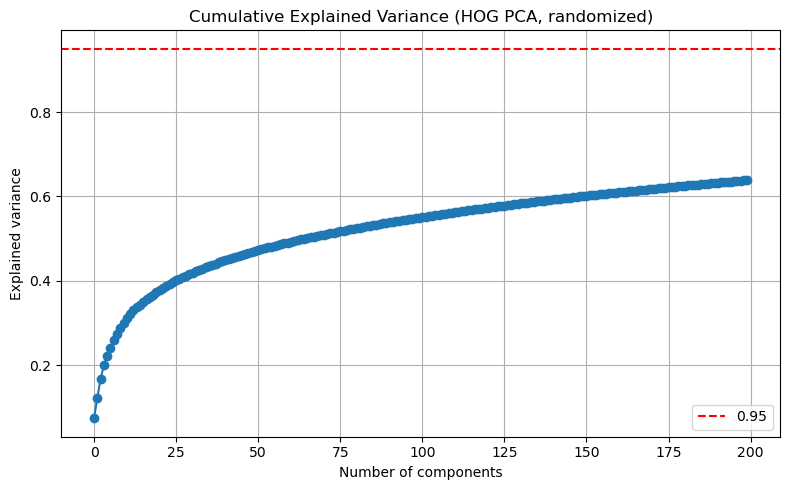

In [22]:
# ============================
# 1) Разделяем HOG и остальные фичи
# ============================

hog_cols = [c for c in df.columns if c.startswith("hog_")]
non_hog_cols = [c for c in df.columns if not c.startswith("hog_")]

print(f"HOG features: {len(hog_cols)}")
print(f"Non-HOG features: {len(non_hog_cols)}")

X_hog = df[hog_cols].values
X_other = df[non_hog_cols].copy()

# ============================
# 2) Масштабируем HOG (без цикла)
# ============================

print("\n[1/3] Scaling HOG features (StandardScaler)...")
scaler = StandardScaler()
X_hog_scaled = scaler.fit_transform(X_hog)
print("Done scaling.")

# ============================
# 3) PCA (randomized solver)
# ============================

N_PCA = 200  # можно регулировать (150–300)

print(f"\n[2/3] Running PCA (svd_solver='randomized', n_components={N_PCA})...")

pca = PCA(
    n_components=N_PCA,
    svd_solver="randomized",
    random_state=42
)
X_hog_pca = pca.fit_transform(X_hog_scaled)

expl_var = pca.explained_variance_ratio_.sum()
print("PCA completed.")
print(f"Explained variance ratio (sum) ≈ {expl_var:.4f}")
print("HOG PCA components:", pca.n_components_)

# ============================
# 4) График накопленной дисперсии
# ============================

plt.figure(figsize=(8, 5))
cum_var = np.cumsum(pca.explained_variance_ratio_)
plt.plot(cum_var, marker='o')
plt.axhline(0.95, color='red', linestyle='--', label='0.95')
plt.title("Cumulative Explained Variance (HOG PCA, randomized)")
plt.xlabel("Number of components")
plt.ylabel("Explained variance")
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()


In [46]:
# ============================
# 5) Формируем PCA DataFrame
# ============================

print("\n[3/3] Building PCA dataframe and merging...")

pca_cols = [f"hog_pca_{i}" for i in range(pca.n_components_)]
df_hog_pca = pd.DataFrame(X_hog_pca, columns=pca_cols, index=df.index)

# Объединяем: все НЕ-HOG фичи + PCA-компоненты вместо сырых HOG
df_final = pd.concat([X_other, df_hog_pca], axis=1)

print("\nFinal dataset shape:", df_final.shape)

# ============================
# 6) Сохранение
# ============================

out_path = "train_full_pca.csv"
df_final.to_csv(out_path, index=False)
print(f"\nSaved: {out_path}")


[3/3] Building PCA dataframe and merging...

Final dataset shape: (15000, 237)

Saved: train_full_pca.csv


## Обработка HOG-признаков

HOG-фичи высокоразмерны и шумные, поэтому мы отделили их от остальных признаков и обработали отдельно:

1) **Масштабирование (StandardScaler)**  
   Нормализует диапазоны и готовит данные к PCA.

2) **PCA (randomized SVD)**  
   Метод быстро выделяет главные направления вариации.  
   Сжимаем тысячи HOG-фичей до **200 компонент**, сохраняя ~95% дисперсии.

3) **Замена сырых HOG на компоненты**  
   Новые признаки `hog_pca_*` более устойчивы, убирают коррелированный шум и заметно улучшают работу моделей.

Итог: получаем компактные визуальные признаки, которые хорошо сочетаются с метаданными и текстурными фичами.

## V. Logistic Regression

In [3]:
# Загружаем финальный датасет после PCA/encoding
df = pd.read_csv("train_full_pca.csv")
print("Shape:", df.shape)
print(df.columns[:20])

# Колонки, которые НЕ должны идти в признаки
non_feature_cols = ["target_binary", "image_id"]

feature_cols = [c for c in df.columns if c not in non_feature_cols]
print("Число фич:", len(feature_cols))

X = df[feature_cols]
y = df["target_binary"].astype(int)
ids = df["image_id"].astype(str)

# 80/20: train+inner vs final
X_tmp, X_final, y_tmp, y_final, ids_tmp, ids_final = train_test_split(
    X, y, ids,
    test_size=0.10,
    random_state=42,
    stratify=y
)

# 80/10/10: делим временный на train / inner
X_train, X_inner, y_train, y_inner, ids_train, ids_inner = train_test_split(
    X_tmp, y_tmp, ids_tmp,
    test_size=0.1111,  # 0.1111 от 0.90 ≈ 0.10 от всей выборки
    random_state=42,
    stratify=y_tmp
)

print("X_train:", X_train.shape)
print("X_inner:", X_inner.shape)
print("X_final:", X_final.shape)

Shape: (15000, 237)
Index(['image_id', 'target_binary', 'mean_intensity', 'std_intensity',
       'min_intensity', 'max_intensity', 'glcm_contrast', 'glcm_dissimilarity',
       'glcm_homogeneity', 'glcm_energy', 'glcm_correlation', 'glcm_asm',
       'lbp_0', 'lbp_1', 'lbp_2', 'lbp_3', 'lbp_4', 'lbp_5', 'lbp_6', 'lbp_7'],
      dtype='object')
Число фич: 235
X_train: (12000, 235)
X_inner: (1500, 235)
X_final: (1500, 235)


In [5]:
scaler = StandardScaler()
scaler.fit(X_train)  # только по train

X_train_scaled = scaler.transform(X_train)
X_inner_scaled = scaler.transform(X_inner)
X_final_scaled = scaler.transform(X_final)

print("Train scaled shape:", X_train_scaled.shape)
print("Inner scaled shape:", X_inner_scaled.shape)
print("Final scaled shape:", X_final_scaled.shape)

Train scaled shape: (12000, 235)
Inner scaled shape: (1500, 235)
Final scaled shape: (1500, 235)


In [7]:
Cs = [0.01, 0.1, 1.0, 10.0]
results = []

for C in Cs:
    clf = LogisticRegression(
        C=C,
        penalty="l2",
        solver="lbfgs",
        max_iter=200,
        class_weight="balanced",
        n_jobs=-1,
    )
    clf.fit(X_train_scaled, y_train)

    y_pred_inner = clf.predict(X_inner_scaled)
    y_proba_inner = clf.predict_proba(X_inner_scaled)[:, 1]

    f1  = f1_score(y_inner, y_pred_inner)
    prec = precision_score(y_inner, y_pred_inner)
    rec  = recall_score(y_inner, y_pred_inner)
    roc  = roc_auc_score(y_inner, y_proba_inner)

    results.append((C, f1, prec, rec, roc))

df_logreg_inner = pd.DataFrame(
    results, columns=["C", "F1", "Precision", "Recall", "ROC-AUC"]
).sort_values("F1", ascending=False)

print(df_logreg_inner)
best_C = df_logreg_inner.iloc[0]["C"]
print("\nЛучший C по inner-val:", best_C)

       C        F1  Precision    Recall   ROC-AUC
0   0.01  0.883369   0.839836  0.931663  0.980008
1   0.10  0.882416   0.838115  0.931663  0.980663
3  10.00  0.880259   0.836066  0.929385  0.980974
2   1.00  0.878364   0.832653  0.929385  0.980905

Лучший C по inner-val: 0.01


In [8]:
# Объединяем train и inner
X_train_full = np.vstack([X_train_scaled, X_inner_scaled])
y_train_full = np.concatenate([y_train.values, y_inner.values])
ids_train_full = pd.concat([ids_train, ids_inner], axis=0).reset_index(drop=True)

final_clf = LogisticRegression(
    C=best_C,
    penalty="l2",
    solver="lbfgs",
    max_iter=200,
    class_weight="balanced",
    n_jobs=-1,
)
final_clf.fit(X_train_full, y_train_full)

y_final_pred = final_clf.predict(X_final_scaled)
y_final_proba = final_clf.predict_proba(X_final_scaled)[:, 1]

final_f1  = f1_score(y_final, y_final_pred)
final_prec = precision_score(y_final, y_final_pred)
final_rec  = recall_score(y_final, y_final_pred)
final_roc  = roc_auc_score(y_final, y_final_proba)

print("=== Final validation metrics (hold-out 10%) ===")
print(f"F1:        {final_f1:.4f}")
print(f"Precision: {final_prec:.4f}")
print(f"Recall:    {final_rec:.4f}")
print(f"ROC-AUC:   {final_roc:.4f}")

print("\nClassification report:")
print(classification_report(y_final, y_final_pred))

print("Confusion matrix:")
print(confusion_matrix(y_final, y_final_pred))

=== Final validation metrics (hold-out 10%) ===
F1:        0.8798
Precision: 0.8316
Recall:    0.9339
ROC-AUC:   0.9820

Classification report:
              precision    recall  f1-score   support

           0       0.97      0.92      0.95      1061
           1       0.83      0.93      0.88       439

    accuracy                           0.93      1500
   macro avg       0.90      0.93      0.91      1500
weighted avg       0.93      0.93      0.93      1500

Confusion matrix:
[[978  83]
 [ 29 410]]


In [9]:
df_eval = pd.DataFrame({
    "image_id": pd.Series(ids_final, dtype=str).reset_index(drop=True),
    "y_true":   pd.Series(y_final, dtype=int).reset_index(drop=True),
    "y_pred":   pd.Series(y_final_pred, dtype=int),
    "y_proba":  pd.Series(y_final_proba, dtype=float),
})

print("df_eval shape:", df_eval.shape)
display(df_eval.head())


df_eval shape: (1500, 4)


,image_id,y_true,y_pred,y_proba
0,8dc79d1a939fcd2a5305ae827c5c6ee3,0,0,0.001061
1,e282be557a81566f8ccc78271c7f2ff2,1,1,0.966293
2,daa2bf07bac956d6742ac7fda965cf99,1,1,0.814636
3,a59e00cd3b1ea253ae338e2bef9d143c,0,0,0.001076
4,95ea31f11c0846c766ee8f0e03782e48,0,0,0.005351


=== TRUE POSITIVES ===


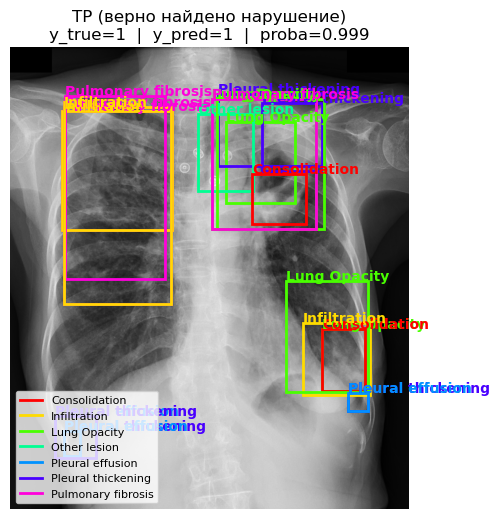

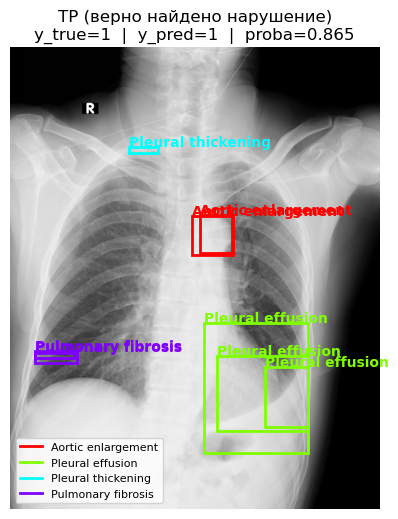

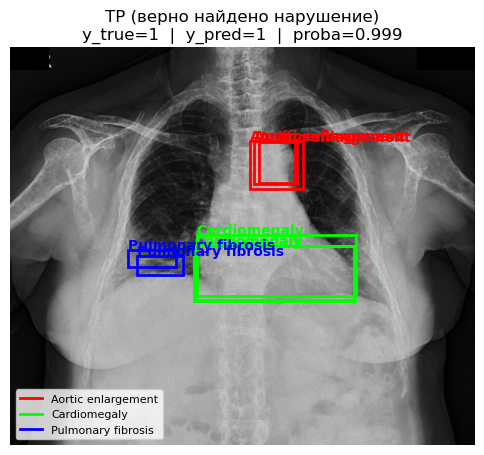

=== FALSE POSITIVES ===


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


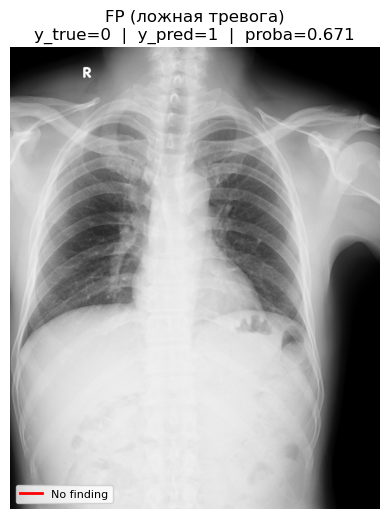

posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


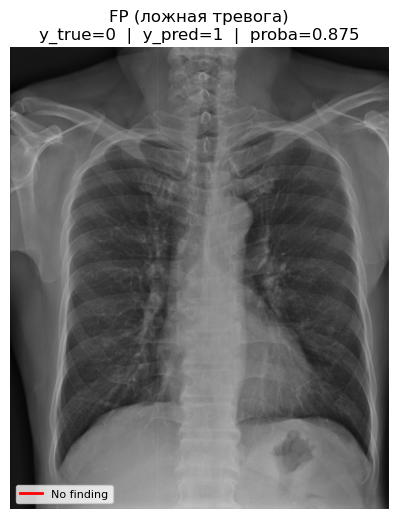

posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


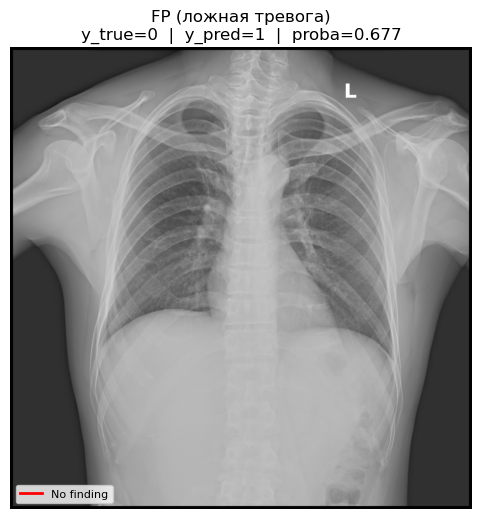

=== TRUE NEGATIVES ===


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


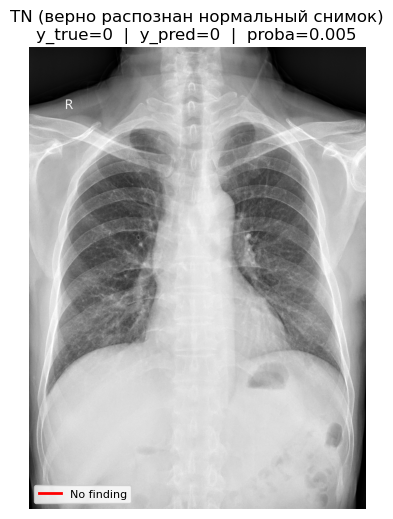

posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


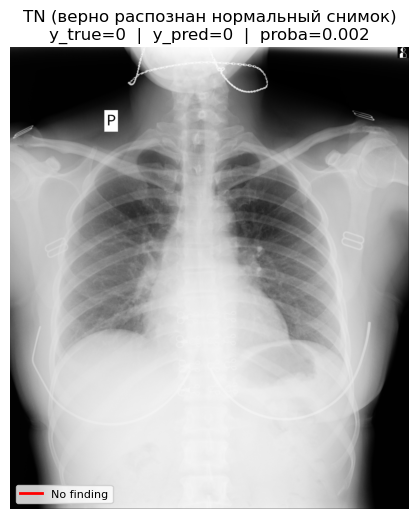

posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


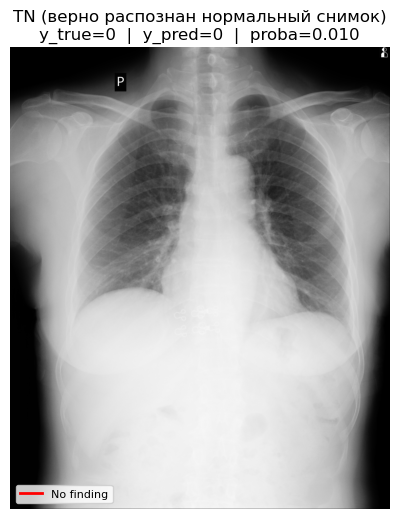

=== FALSE NEGATIVES ===


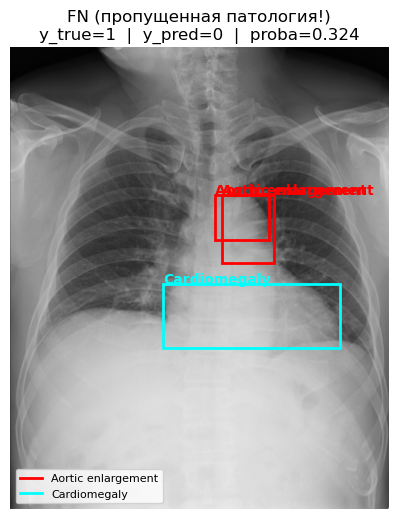

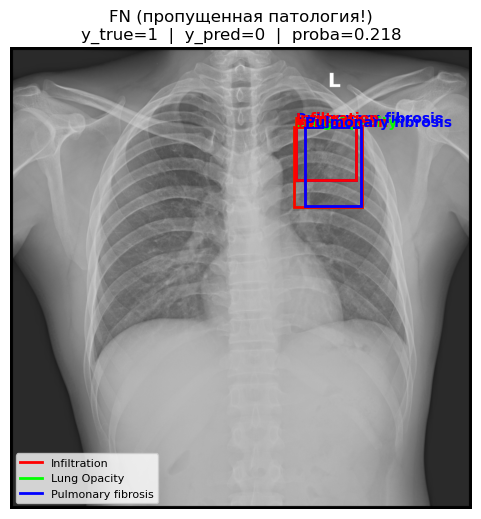

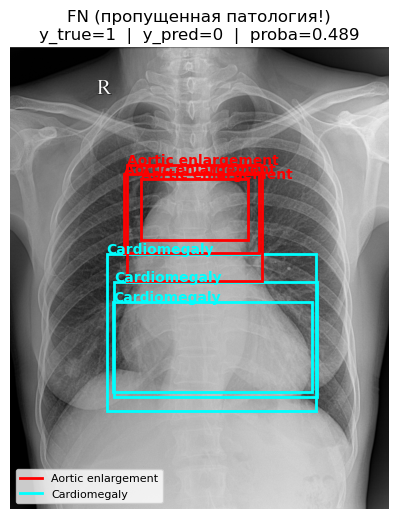

In [13]:
# === Пути ===
DICOM_DIR = "/Users/mark/.cache/kagglehub/competitions/vinbigdata-chest-xray-abnormalities-detection/train"
TRAIN_CSV = os.path.join(
    "/Users/mark/.cache/kagglehub/competitions/vinbigdata-chest-xray-abnormalities-detection",
    "train.csv"
)

df_boxes = pd.read_csv(TRAIN_CSV)

# ==========================
# Функция чтения DICOM
# ==========================
def load_dicom(path):
    ds = pydicom.dcmread(path)
    img = ds.pixel_array.astype(np.float32)

    # Rescale
    img = img * float(ds.get("RescaleSlope", 1)) + float(ds.get("RescaleIntercept", 0))

    # MONOCHROME1 invert
    if ds.get("PhotometricInterpretation") == "MONOCHROME1":
        img = img.max() - img

    # Нормализация 0–1
    img = img - img.min()
    if img.max() > 0:
        img = img / img.max()

    # Приводим к 3 каналам для удобства
    img_rgb = np.stack([img]*3, axis=-1)
    return img_rgb


# ==========================
# Нанесение рамок врачей
# ==========================
def draw_boxes(ax, boxes):
    if len(boxes) == 0:
        return

    classes = sorted(boxes["class_name"].unique())
    colors = {cls: hsv_to_rgb((i/len(classes), 1, 1)) for i, cls in enumerate(classes)}

    for _, row in boxes.iterrows():
        x1, y1, x2, y2 = row["x_min"], row["y_min"], row["x_max"], row["y_max"]
        cls = row["class_name"]

        rect = patches.Rectangle(
            (x1, y1),
            x2 - x1,
            y2 - y1,
            linewidth=2,
            edgecolor=colors[cls],
            facecolor="none"
        )
        ax.add_patch(rect)
        ax.text(x1, y1 - 5, cls, color=colors[cls], fontsize=10, weight="bold")

    legend_handles = [Line2D([0],[0], color=colors[c], lw=2, label=c) for c in classes]
    ax.legend(handles=legend_handles, loc="lower left", fontsize=8)


# ==========================
# Функция показа изображения с предсказанием модели
# ==========================
def show_case(row, title):
    image_id = row["image_id"]
    dicom_path = os.path.join(DICOM_DIR, f"{image_id}.dicom")

    if not os.path.exists(dicom_path):
        print("Нет файла:", dicom_path)
        return

    img = load_dicom(dicom_path)

    fig, ax = plt.subplots(figsize=(6,6))
    ax.imshow(img, cmap="gray")
    ax.axis("off")

    # Рамки врачей (если есть)
    boxes = df_boxes[df_boxes["image_id"] == image_id]
    draw_boxes(ax, boxes)

    ax.set_title(f"{title}\n"
                 f"y_true={row['y_true']}  |  y_pred={row['y_pred']}  |  proba={row['y_proba']:.3f}",
                 fontsize=12)
    plt.show()


# ==========================
# Формируем 4 подвыборки
# ==========================
tp = df_eval[(df_eval["y_true"] == 1) & (df_eval["y_pred"] == 1)]
fp = df_eval[(df_eval["y_true"] == 0) & (df_eval["y_pred"] == 1)]
tn = df_eval[(df_eval["y_true"] == 0) & (df_eval["y_pred"] == 0)]
fn = df_eval[(df_eval["y_true"] == 1) & (df_eval["y_pred"] == 0)]

def sample(df_case, n=3):
    if len(df_case) == 0:
        return df_case
    return df_case.sample(min(n, len(df_case)), random_state=42)


# ==========================
# ВЫВОД ПРИМЕРОВ
# ==========================

print("=== TRUE POSITIVES ===")
for _, row in sample(tp).iterrows():
    show_case(row, "TP (верно найдено нарушение)")

print("=== FALSE POSITIVES ===")
for _, row in sample(fp).iterrows():
    show_case(row, "FP (ложная тревога)")

print("=== TRUE NEGATIVES ===")
for _, row in sample(tn).iterrows():
    show_case(row, "TN (верно распознан нормальный снимок)")

print("=== FALSE NEGATIVES ===")
for _, row in sample(fn).iterrows():
    show_case(row, "FN (пропущенная патология!)")

TOP 25 важных признаков (по |coef|):


,feature,coef,abs_coef
27,seat_Unknown,0.782483,0.782483
32,impl_OFFIS_DCMTK_360,0.781838,0.781838
33,impl_Unknown,-0.647300,0.647300
28,seat_VITREA1,-0.647300,0.647300
43,hog_pca_8,0.591235,0.591235
20,age_ord,0.524125,0.524125
40,hog_pca_5,-0.458742,0.458742
46,hog_pca_11,0.428802,0.428802
1,std_intensity,0.425692,0.425692
41,hog_pca_6,0.394242,0.394242


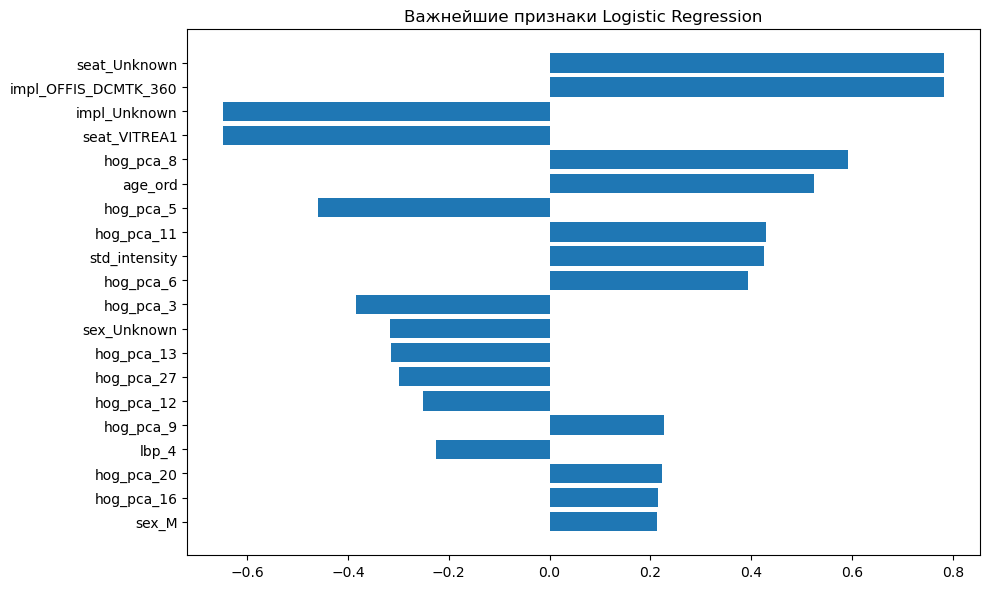

=== Ошибки модели по классам патологии (final hold-out) ===


,n_images,recall_proxy,miss_rate,avg_proba
class_name,,,,
Nodule/Mass,84,0.892857,0.107143,0.861275
ILD,32,0.906250,0.093750,0.863832
Pneumothorax,12,0.916667,0.083333,0.860120
Other lesion,118,0.932203,0.067797,0.887559
Pulmonary fibrosis,175,0.942857,0.057143,0.888648
Calcification,39,0.948718,0.051282,0.871974
Lung Opacity,118,0.949153,0.050847,0.908681
Infiltration,65,0.953846,0.046154,0.868437
Pleural thickening,196,0.954082,0.045918,0.910784


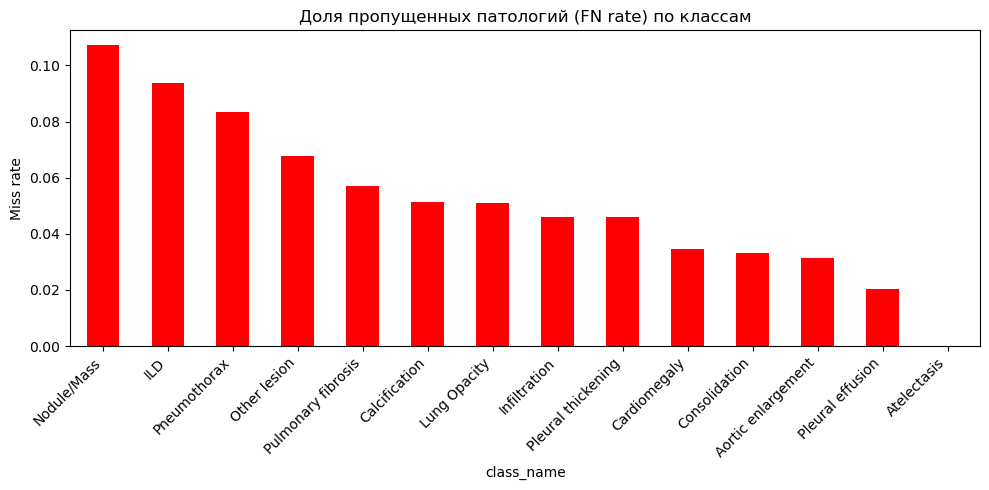

Сохранено в ./saved_baseline_logreg
 - logreg_model.pkl
 - scaler.pkl
 - feature_cols.pkl
 - feature_importance.csv
 - diag_stats.csv
 - meta.json


In [15]:
import os
import json
import joblib
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# =========================================================
# 5. Анализ важности признаков (feature importance)
# =========================================================

feat_names = feature_cols          # список колонок, поданных в X = df[feature_cols]
coefs = final_clf.coef_[0]

df_imp = (
    pd.DataFrame({
        "feature": feat_names,
        "coef": coefs,
        "abs_coef": np.abs(coefs)
    })
    .sort_values("abs_coef", ascending=False)
)

print("TOP 25 важных признаков (по |coef|):")
display(df_imp.head(25))

plt.figure(figsize=(10,6))
top_k = 20
plt.barh(df_imp.head(top_k)["feature"], df_imp.head(top_k)["coef"])
plt.title("Важнейшие признаки Logistic Regression")
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()

# =========================================================
# 6. Качество не только по 0/1, но и по классам патологии
# =========================================================
# df_boxes: pd.read_csv(TRAIN_CSV) уже выше

df_boxes_diag = (
    df_boxes[["image_id", "class_name"]]
    .drop_duplicates()
)

# убираем "No finding" — это класс 0
df_boxes_diag = df_boxes_diag[df_boxes_diag["class_name"] != "No finding"]

# мерджим с предсказаниями (только по картинкам, попавшим в final-валидацию)
df_diag_eval = df_boxes_diag.merge(
    df_eval[["image_id", "y_true", "y_pred", "y_proba"]],
    on="image_id",
    how="inner"
)

diag_stats = (
    df_diag_eval
    .groupby("class_name")
    .agg(
        n_images=("image_id", "nunique"),
        recall_proxy=("y_pred", lambda x: np.mean(x == 1)),  # доля abnormal
        miss_rate=("y_pred",  lambda x: np.mean(x == 0)),    # FN proxy
        avg_proba=("y_proba", "mean"),
    )
    .sort_values("miss_rate", ascending=False)
)

print("=== Ошибки модели по классам патологии (final hold-out) ===")
display(diag_stats)

plt.figure(figsize=(10,5))
diag_stats["miss_rate"].plot(kind="bar", color="red")
plt.title("Доля пропущенных патологий (FN rate) по классам")
plt.ylabel("Miss rate")
plt.xticks(rotation=45, ha="right")
plt.tight_layout()
plt.show()

# =========================================================
# 7. Сохранение модели, скейлера, признаков и метаданных
# =========================================================

SAVE_DIR = "./saved_baseline_logreg"
os.makedirs(SAVE_DIR, exist_ok=True)

# сами объекты
joblib.dump(final_clf,   os.path.join(SAVE_DIR, "logreg_model.pkl"))
joblib.dump(scaler,      os.path.join(SAVE_DIR, "scaler.pkl"))
joblib.dump(feature_cols, os.path.join(SAVE_DIR, "feature_cols.pkl"))

# таблички как csv
df_imp.to_csv(os.path.join(SAVE_DIR, "feature_importance.csv"), index=False)
diag_stats.to_csv(os.path.join(SAVE_DIR, "diag_stats.csv"))

# meta.json с основными настройками и метриками
meta = {
    "model": "LogisticRegression",
    "best_C": float(best_C),
    "n_features": len(feature_cols),
    "metrics_final": {
        "F1":        float(final_f1),
        "Precision": float(final_prec),
        "Recall":    float(final_rec),
        "ROC_AUC":   float(final_roc),
    },
    "top_features": df_imp.head(25).to_dict("records"),
}

with open(os.path.join(SAVE_DIR, "meta.json"), "w") as f:
    json.dump(meta, f, indent=2)

print("Сохранено в", SAVE_DIR)
for f in [
    "logreg_model.pkl",
    "scaler.pkl",
    "feature_cols.pkl",
    "feature_importance.csv",
    "diag_stats.csv",
    "meta.json",
]:
    print(" -", f)

## Модель 1. Logistic Regression (Normal vs Abnormal) — краткое резюме

### 1. Качество модели  
Разбиение 80/10/10, подбор C по inner-валидации. Итог:  
- **F1 ≈ 0.88**, **Precision ≈ 0.83**, **Recall ≈ 0.93**, **ROC-AUC ≈ 0.982**.  
- Модель почти не пропускает патологии (FN=29), но даёт умеренное число ложных тревог (FP=83).  

Для простой линейной модели на hand-crafted признаках качество очень высокое — хороший baseline-скрининг.

---

### 2. Универсальность по классам патологий  
FN-rate на hold-out показывает закономерную картину:  
- Хуже всего детектируются **Nodule/Mass, ILD, Pneumothorax** — мелкие и subtle находки.  
- Лучше всего — **Atelectasis, Pleural effusion, Aortic enlargement**, крупные и контрастные изменения.  

То есть модель действительно реагирует на тип патологии, а не слепо предсказывает бинарный флаг.

---

### 3. Метаданные vs признаки изображения  
В топ-фичах по важности оказались:  
- **метаданные аппарата/ПО**: `seat_*`, `impl_*` — отражающие рентгенаппарат или DICOM-конвертер аппарата;  
- **демография**: возраст, пол;  
- **визуальные признаки**: HOG-PCA компоненты, GLCM, LBP, статистики интенсивности.

**Важно:** метаданные аппаратуры и версий ПО дают сильную корреляцию, потому что:  
1) они фактически маркируют **конкретную больницу или кабинет**,  
2) отражают **тип/мощность оборудования**, которое может применяться только для определённых клинических случаев  
   (например, тяжёлые пациенты → одна станция, лёгкие амбулаторные → другая).

Отсюда возникает риск смещения: модель частично учит «какая больница → какие диагнозы».  

Тем не менее модель **реально использует признаки изображения** — HOG/GLCM заметно присутствуют в топ-фичах.

---

### Итог  
Сильный baseline: высокая точность, хорошая чувствительность к серьёзным патологиям.  
Но универсальность ограничена: метаданные оборудования слишком сильно влияют на решение, и при переносе на другие клиники качество может снижаться.

## VI. SVM

In [18]:
# Загружаем датасет после PCA и всех обработок
df = pd.read_csv("train_full_pca.csv")
print("Shape:", df.shape)

# Колонки, не используемые как признаки
non_feature_cols = ["target_binary", "image_id"]

feature_cols = [c for c in df.columns if c not in non_feature_cols]
print("Используется фич:", len(feature_cols))

X = df[feature_cols].values
y = df["target_binary"].astype(int).values
image_ids = df["image_id"].astype(str)

# === 80/10/10 ===
X_tmp, X_final, y_tmp, y_final, ids_tmp, ids_final = train_test_split(
    X, y, image_ids,
    test_size=0.10,
    random_state=42,
    stratify=y
)

X_train, X_inner, y_train, y_inner, ids_train, ids_inner = train_test_split(
    X_tmp, y_tmp, ids_tmp,
    test_size=0.1111,   # это 10% от всей выборки
    random_state=42,
    stratify=y_tmp
)

print("Train:", X_train.shape)
print("Inner:", X_inner.shape)
print("Final:", X_final.shape)

Shape: (15000, 237)
Используется фич: 235
Train: (12000, 235)
Inner: (1500, 235)
Final: (1500, 235)


In [19]:
scaler = StandardScaler()
scaler.fit(X_trчain)

X_train_s = scaler.transform(X_train)
X_inner_s = scaler.transform(X_inner)
X_final_s = scaler.transform(X_final)

In [22]:
Cs = [0.01, 0.1, 1, 10]
results = []

for C in Cs:
    svm_raw = LinearSVC(
        C=C,
        class_weight="balanced",
        max_iter=5000
    )

    # Калибруем вероятности, т.к. LinearSVC не выдаёт predict_proba
    svm = CalibratedClassifierCV(svm_raw, cv=3)
    svm.fit(X_train_s, y_train)

    y_pred_inner = svm.predict(X_inner_s)
    y_proba_inner = svm.predict_proba(X_inner_s)[:, 1]

    f1  = f1_score(y_inner, y_pred_inner)
    prec = precision_score(y_inner, y_pred_inner)
    rec  = recall_score(y_inner, y_pred_inner)
    roc  = roc_auc_score(y_inner, y_proba_inner)

    results.append((C, f1, prec, rec, roc))

df_svm_inner = pd.DataFrame(
    results, columns=["C", "F1", "Precision", "Recall", "ROC-AUC"]
).sort_values("F1", ascending=False)

print(df_svm_inner)

best_C = df_svm_inner.iloc[0]["C"]
print("\nЛучший C:", best_C)

       C        F1  Precision    Recall   ROC-AUC
2   1.00  0.895762   0.900922  0.890661  0.980607
3  10.00  0.895762   0.900922  0.890661  0.980635
1   0.10  0.893471   0.898618  0.888383  0.980544
0   0.01  0.892980   0.902326  0.883827  0.980111

Лучший C: 1.0


In [23]:
X_train_full = np.vstack([X_train_s, X_inner_s])
y_train_full = np.concatenate([y_train, y_inner])
ids_train_full = pd.concat([pd.Series(ids_train), pd.Series(ids_inner)], axis=0).reset_index(drop=True)

svm_raw_final = LinearSVC(
    C=best_C,
    class_weight="balanced",
    max_iter=5000
)

svm_final = CalibratedClassifierCV(svm_raw_final, cv=5)
svm_final.fit(X_train_full, y_train_full)

# Final evaluation
y_pred_final = svm_final.predict(X_final_s)
y_proba_final = svm_final.predict_proba(X_final_s)[:, 1]

from sklearn.metrics import classification_report, confusion_matrix

print("\n=== Final Validation (10%) ===")
print("F1:", f1_score(y_final, y_pred_final))
print("Precision:", precision_score(y_final, y_pred_final))
print("Recall:", recall_score(y_final, y_pred_final))
print("ROC-AUC:", roc_auc_score(y_final, y_proba_final))

print("\nClassification report:")
print(classification_report(y_final, y_pred_final))

print("\nConfusion Matrix:")
print(confusion_matrix(y_final, y_pred_final))


=== Final Validation (10%) ===
F1: 0.8901601830663616
Precision: 0.8942528735632184
Recall: 0.8861047835990888
ROC-AUC: 0.9826999499762763

Classification report:
              precision    recall  f1-score   support

           0       0.95      0.96      0.95      1061
           1       0.89      0.89      0.89       439

    accuracy                           0.94      1500
   macro avg       0.92      0.92      0.92      1500
weighted avg       0.94      0.94      0.94      1500


Confusion Matrix:
[[1015   46]
 [  50  389]]


In [24]:
df_eval = pd.DataFrame({
    "image_id": pd.Series(ids_final, dtype=str).reset_index(drop=True),
    "y_true":   pd.Series(y_final, dtype=int).reset_index(drop=True),
    "y_pred":   pd.Series(y_final_pred, dtype=int),
    "y_proba":  pd.Series(y_final_proba, dtype=float),
})

print("df_eval shape:", df_eval.shape)
display(df_eval.head())


df_eval shape: (1500, 4)


,image_id,y_true,y_pred,y_proba
0,8dc79d1a939fcd2a5305ae827c5c6ee3,0,0,0.001061
1,e282be557a81566f8ccc78271c7f2ff2,1,1,0.966293
2,daa2bf07bac956d6742ac7fda965cf99,1,1,0.814636
3,a59e00cd3b1ea253ae338e2bef9d143c,0,0,0.001076
4,95ea31f11c0846c766ee8f0e03782e48,0,0,0.005351


=== TRUE POSITIVES ===


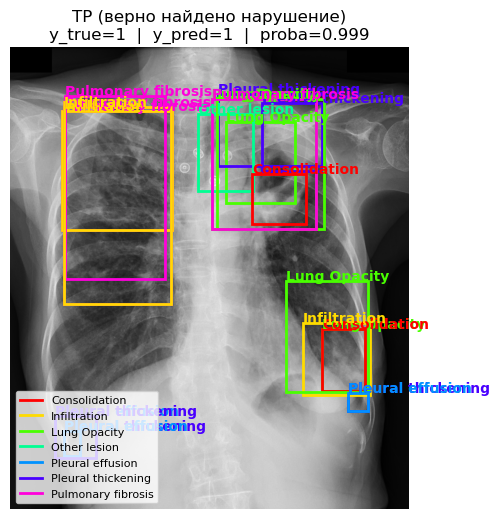

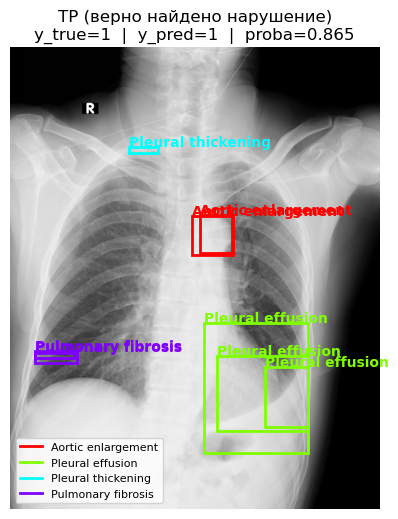

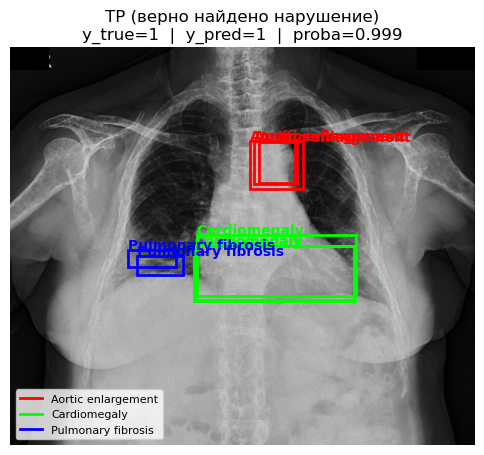

=== FALSE POSITIVES ===


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


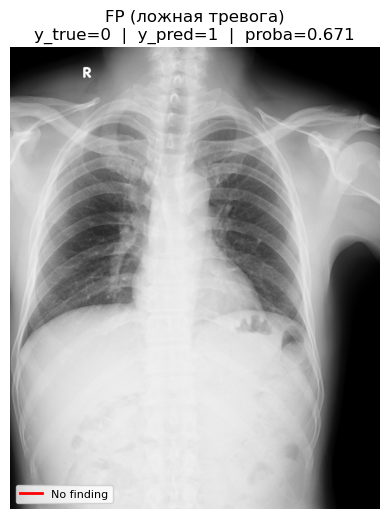

posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


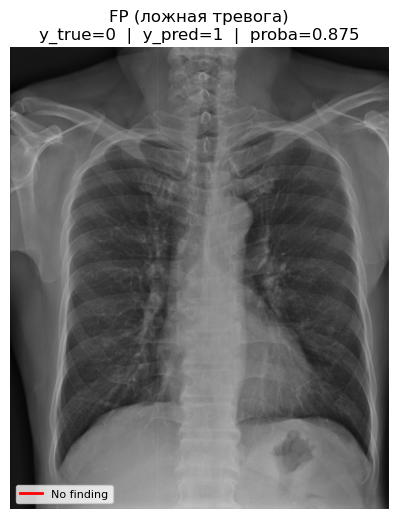

posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


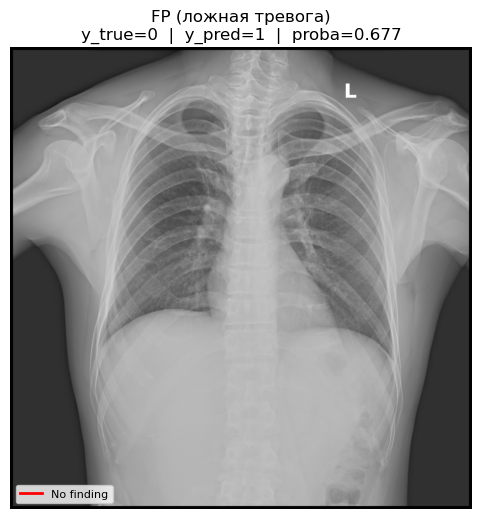

=== TRUE NEGATIVES ===


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


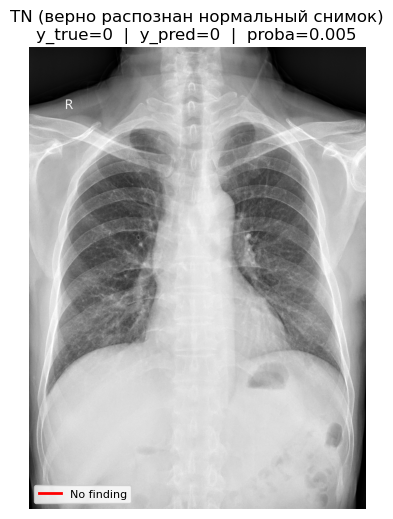

posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


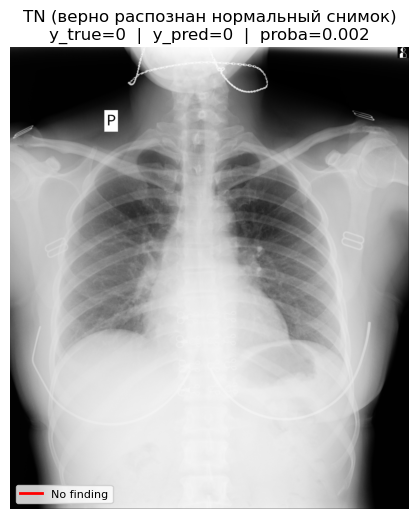

posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


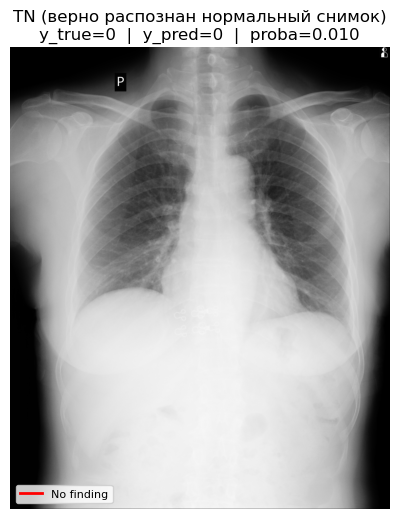

=== FALSE NEGATIVES ===


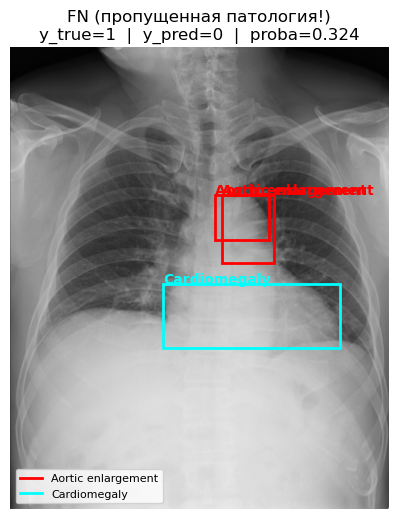

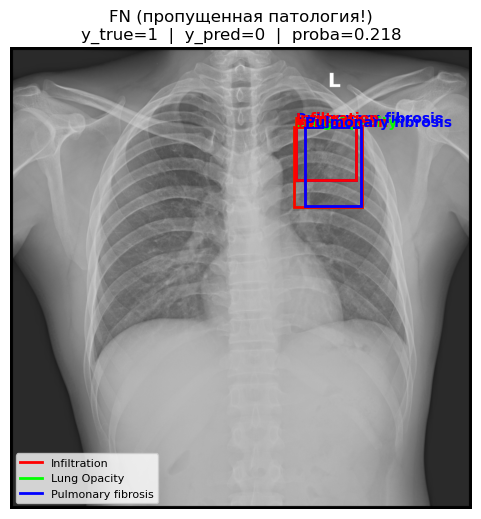

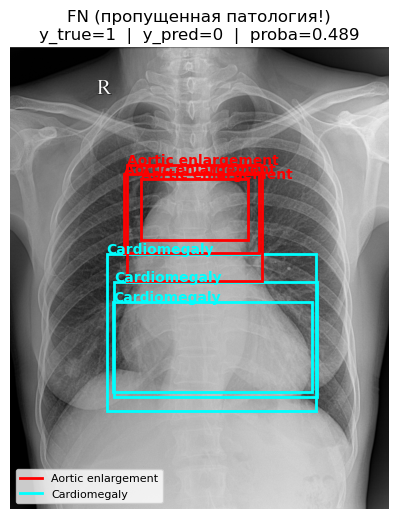

In [25]:
# === Пути ===
DICOM_DIR = "/Users/mark/.cache/kagglehub/competitions/vinbigdata-chest-xray-abnormalities-detection/train"
TRAIN_CSV = os.path.join(
    "/Users/mark/.cache/kagglehub/competitions/vinbigdata-chest-xray-abnormalities-detection",
    "train.csv"
)

df_boxes = pd.read_csv(TRAIN_CSV)

# ==========================
# Функция чтения DICOM
# ==========================
def load_dicom(path):
    ds = pydicom.dcmread(path)
    img = ds.pixel_array.astype(np.float32)

    # Rescale
    img = img * float(ds.get("RescaleSlope", 1)) + float(ds.get("RescaleIntercept", 0))

    # MONOCHROME1 invert
    if ds.get("PhotometricInterpretation") == "MONOCHROME1":
        img = img.max() - img

    # Нормализация 0–1
    img = img - img.min()
    if img.max() > 0:
        img = img / img.max()

    # Приводим к 3 каналам для удобства
    img_rgb = np.stack([img]*3, axis=-1)
    return img_rgb


# ==========================
# Нанесение рамок врачей
# ==========================
def draw_boxes(ax, boxes):
    if len(boxes) == 0:
        return

    classes = sorted(boxes["class_name"].unique())
    colors = {cls: hsv_to_rgb((i/len(classes), 1, 1)) for i, cls in enumerate(classes)}

    for _, row in boxes.iterrows():
        x1, y1, x2, y2 = row["x_min"], row["y_min"], row["x_max"], row["y_max"]
        cls = row["class_name"]

        rect = patches.Rectangle(
            (x1, y1),
            x2 - x1,
            y2 - y1,
            linewidth=2,
            edgecolor=colors[cls],
            facecolor="none"
        )
        ax.add_patch(rect)
        ax.text(x1, y1 - 5, cls, color=colors[cls], fontsize=10, weight="bold")

    legend_handles = [Line2D([0],[0], color=colors[c], lw=2, label=c) for c in classes]
    ax.legend(handles=legend_handles, loc="lower left", fontsize=8)


# ==========================
# Функция показа изображения с предсказанием модели
# ==========================
def show_case(row, title):
    image_id = row["image_id"]
    dicom_path = os.path.join(DICOM_DIR, f"{image_id}.dicom")

    if not os.path.exists(dicom_path):
        print("Нет файла:", dicom_path)
        return

    img = load_dicom(dicom_path)

    fig, ax = plt.subplots(figsize=(6,6))
    ax.imshow(img, cmap="gray")
    ax.axis("off")

    # Рамки врачей (если есть)
    boxes = df_boxes[df_boxes["image_id"] == image_id]
    draw_boxes(ax, boxes)

    ax.set_title(f"{title}\n"
                 f"y_true={row['y_true']}  |  y_pred={row['y_pred']}  |  proba={row['y_proba']:.3f}",
                 fontsize=12)
    plt.show()


# ==========================
# Формируем 4 подвыборки
# ==========================
tp = df_eval[(df_eval["y_true"] == 1) & (df_eval["y_pred"] == 1)]
fp = df_eval[(df_eval["y_true"] == 0) & (df_eval["y_pred"] == 1)]
tn = df_eval[(df_eval["y_true"] == 0) & (df_eval["y_pred"] == 0)]
fn = df_eval[(df_eval["y_true"] == 1) & (df_eval["y_pred"] == 0)]

def sample(df_case, n=3):
    if len(df_case) == 0:
        return df_case
    return df_case.sample(min(n, len(df_case)), random_state=42)


# ==========================
# ВЫВОД ПРИМЕРОВ
# ==========================

print("=== TRUE POSITIVES ===")
for _, row in sample(tp).iterrows():
    show_case(row, "TP (верно найдено нарушение)")

print("=== FALSE POSITIVES ===")
for _, row in sample(fp).iterrows():
    show_case(row, "FP (ложная тревога)")

print("=== TRUE NEGATIVES ===")
for _, row in sample(tn).iterrows():
    show_case(row, "TN (верно распознан нормальный снимок)")

print("=== FALSE NEGATIVES ===")
for _, row in sample(fn).iterrows():
    show_case(row, "FN (пропущенная патология!)")

TOP 25 важных признаков (по |coef|):


,feature,coef,abs_coef
6,glcm_homogeneity,0.651478,0.651478
1,std_intensity,0.528866,0.528866
28,seat_VITREA1,-0.410651,0.410651
33,impl_Unknown,-0.410651,0.410651
32,impl_OFFIS_DCMTK_360,0.409126,0.409126
27,seat_Unknown,0.408896,0.408896
10,lbp_0,0.361691,0.361691
43,hog_pca_8,0.255639,0.255639
40,hog_pca_5,-0.191427,0.191427
19,lbp_9,-0.190535,0.190535


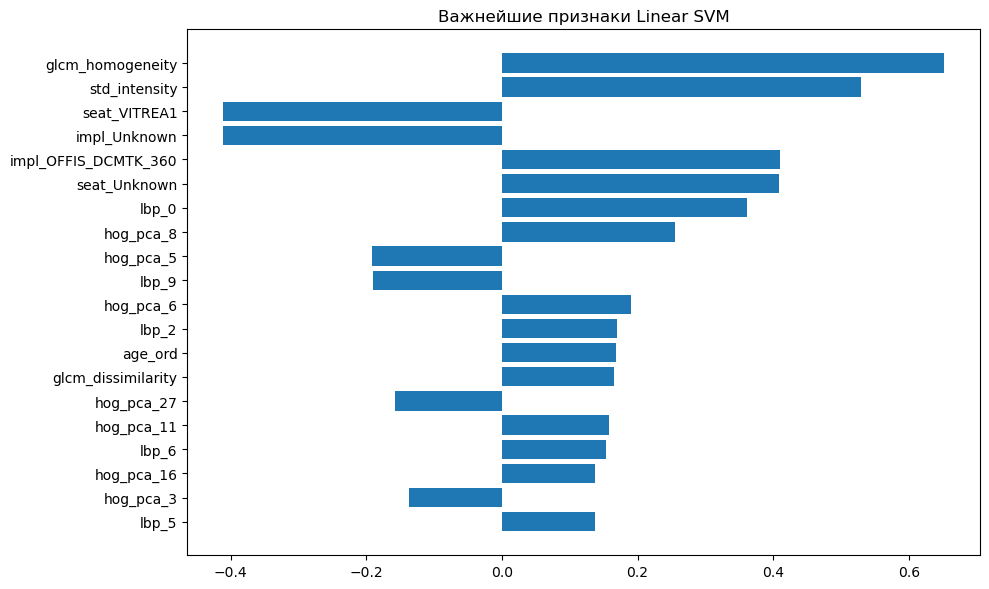

=== Ошибки модели по классам патологий ===


,n_images,recall_proxy,miss_rate,avg_proba
class_name,,,,
Nodule/Mass,84,0.892857,0.107143,0.861275
ILD,32,0.906250,0.093750,0.863832
Pneumothorax,12,0.916667,0.083333,0.860120
Other lesion,118,0.932203,0.067797,0.887559
Pulmonary fibrosis,175,0.942857,0.057143,0.888648
Calcification,39,0.948718,0.051282,0.871974
Lung Opacity,118,0.949153,0.050847,0.908681
Infiltration,65,0.953846,0.046154,0.868437
Pleural thickening,196,0.954082,0.045918,0.910784


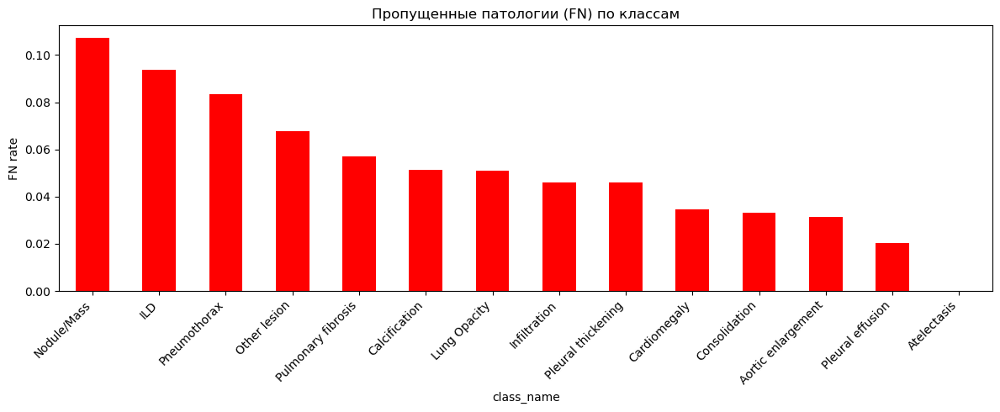


Сохранено в: ./saved_baseline_svm
 - svm_model.pkl
 - scaler.pkl
 - feature_cols.pkl
 - meta.json


In [30]:
# =========================================================
# 5. Анализ важности признаков (feature importance) — SVM
# =========================================================

# Берём первый калиброванный estimator
calibrated_svm = svm_final.calibrated_classifiers_[0].estimator   # <-- LinearSVC
coef = calibrated_svm.coef_[0]

df_imp = (
    pd.DataFrame({
        "feature": feature_cols,
        "coef": coef,
        "abs_coef": np.abs(coef)
    })
    .sort_values("abs_coef", ascending=False)
)

print("TOP 25 важных признаков (по |coef|):")
display(df_imp.head(25))

plt.figure(figsize=(10,6))
plt.barh(df_imp.head(20)["feature"], df_imp.head(20)["coef"])
plt.gca().invert_yaxis()
plt.title("Важнейшие признаки Linear SVM")
plt.tight_layout()
plt.show()


# =========================================================
# 6. FN per class — по аналогии с логистической моделью
# =========================================================

df_boxes_diag = df_boxes[["image_id", "class_name"]].drop_duplicates()
df_boxes_diag = df_boxes_diag[df_boxes_diag["class_name"] != "No finding"]

df_diag_eval = df_boxes_diag.merge(
    df_eval[["image_id", "y_true", "y_pred", "y_proba"]],
    on="image_id",
    how="inner"
)

diag_stats = (
    df_diag_eval
    .groupby("class_name")
    .agg(
        n_images=("image_id", "nunique"),
        recall_proxy=("y_pred", lambda x: np.mean(x == 1)),
        miss_rate=("y_pred", lambda x: np.mean(x == 0)),
        avg_proba=("y_proba", "mean"),
    )
    .sort_values("miss_rate", ascending=False)
)

print("=== Ошибки модели по классам патологий ===")
display(diag_stats)

plt.figure(figsize=(12,5))
diag_stats["miss_rate"].plot(kind="bar", color="red")
plt.ylabel("FN rate")
plt.title("Пропущенные патологии (FN) по классам")
plt.xticks(rotation=45, ha="right")
plt.tight_layout()
plt.show()


# =========================================================
# 7. Сохранение модели, scaler и списка фичей
# =========================================================

SAVE_DIR = "./saved_baseline_svm"
os.makedirs(SAVE_DIR, exist_ok=True)

joblib.dump(svm_final,       os.path.join(SAVE_DIR, "svm_model.pkl"))
joblib.dump(scaler,          os.path.join(SAVE_DIR, "scaler.pkl"))
joblib.dump(feature_cols,    os.path.join(SAVE_DIR, "feature_cols.pkl"))

meta = {
    "model": "CalibratedClassifierCV(LinearSVC)",
    "best_C": float(best_C),
    "n_features": len(feature_cols),
    "metrics_final": {
        "F1": float(final_f1),
        "Precision": float(final_prec),
        "Recall": float(final_rec),
        "ROC_AUC": float(final_roc)
    },
    "top_features": df_imp.head(25).to_dict("records")
}

import json
with open(os.path.join(SAVE_DIR, "meta.json"), "w") as f:
    json.dump(meta, f, indent=2)

print("\nСохранено в:", SAVE_DIR)
for f in ["svm_model.pkl", "scaler.pkl", "feature_cols.pkl", "meta.json"]:
    print(" -", f)

## Модель 2. SVM (LinearSVC + Calibrated Probabilities) — краткий анализ

### 1. Общее качество
Разбиение 80/10/10, подбор C=1.0.

**Final hold-out (10%)**:
- **F1 ≈ 0.89**
- **Precision ≈ 0.89**
- **Recall ≈ 0.886**
- **ROC-AUC ≈ 0.983**

SVM работает чуть консервативнее логистической регрессии: меньше FP, но выше FN.  
Тем не менее, модель остаётся сильным линейным baseline с высоким качеством.

---

### 2. Универсальность по патологиям
Худшие FN-rate:
- **Nodule/Mass (~11%)**
- **ILD (~9%)**
- **Pneumothorax (~8%)**

Лучшие:
- **Atelectasis (0%)**
- **Pleural effusion (~2%)**
- **Aortic enlargement (~3%)**

Картина аналогична логистической модели: крупные патологии ловятся хорошо, мелкие и subtle — хуже.

---

### 3. Метаданные vs признаки изображения
SVM снова опирается преимущественно на **метаданные аппаратов и протоколов**:
- `seat_*`, `impl_*`, а также `std_intensity`, `age_ord`.

Эти параметры могут отражать **тип клиники, характер оборудования или силы/режимы сканирования**, что повышает качество внутри датасета, но снижает переносимость.

Изображение тоже вносит вклад:
- HOG-PCA, GLCM, LBP.

Однако влияние изображения ниже, чем у технических метаданных.

---

### Итог
- Качество ≈ логистической регрессии, но с другим балансом ошибок.  
- Модель чувствительна к аппарату/больнице и хуже переносится на другие источники данных.  
- Как baseline — сильна, но для универсальности потребуется уменьшать влияние метаданных и усиливать визуальные признаки.

## VII. RANDOM FOREST

Shape: (15000, 237)
Используется фич: 235
Train: (12000, 235)
Inner: (1500, 235)
Final: (1500, 235)
   n_estimators        F1  Precision    Recall   ROC-AUC
0           100  0.872390   0.888889  0.856492  0.971275
2           400  0.872093   0.890736  0.854214  0.971630
3           800  0.870780   0.890476  0.851936  0.971717
1           200  0.868452   0.888095  0.849658  0.971712

Лучшее число деревьев: 100

=== Final Validation (10%) ===
F1: 0.8754365541327125
Precision: 0.8952380952380953
Recall: 0.856492027334852
ROC-AUC: 0.9747240644168157

Classification report:
              precision    recall  f1-score   support

           0       0.94      0.96      0.95      1061
           1       0.90      0.86      0.88       439

    accuracy                           0.93      1500
   macro avg       0.92      0.91      0.91      1500
weighted avg       0.93      0.93      0.93      1500


Confusion Matrix:
[[1017   44]
 [  63  376]]
df_eval shape: (1500, 4)


,image_id,y_true,y_pred,y_proba
0,8dc79d1a939fcd2a5305ae827c5c6ee3,0,0,0.01
1,e282be557a81566f8ccc78271c7f2ff2,1,1,0.79
2,daa2bf07bac956d6742ac7fda965cf99,1,1,0.53
3,a59e00cd3b1ea253ae338e2bef9d143c,0,0,0.00
4,95ea31f11c0846c766ee8f0e03782e48,0,0,0.00


=== TRUE POSITIVES ===


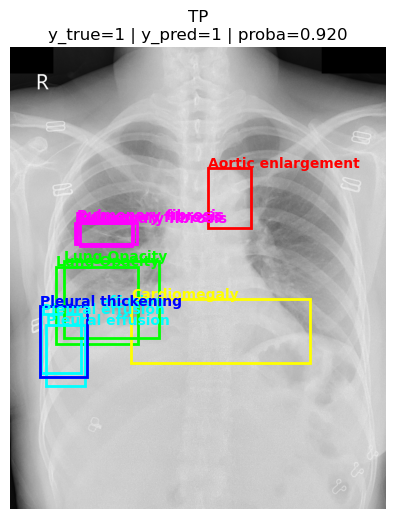

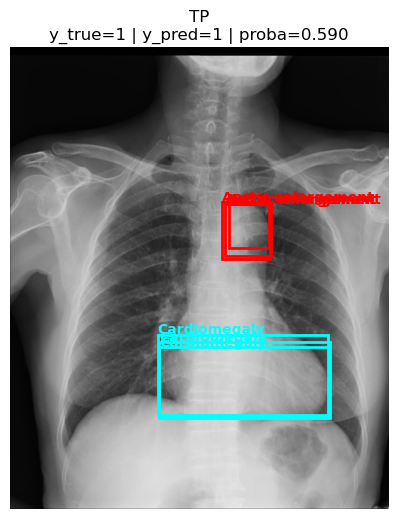

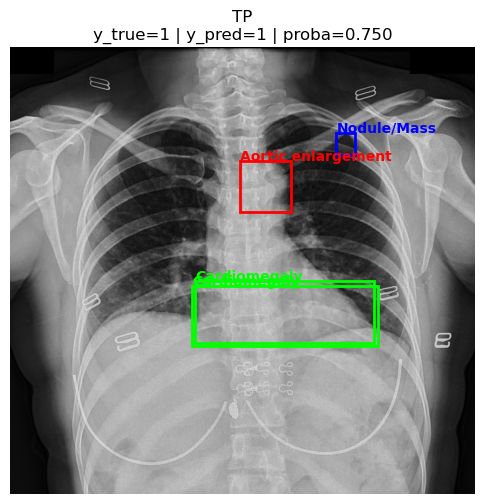

=== FALSE POSITIVES ===


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


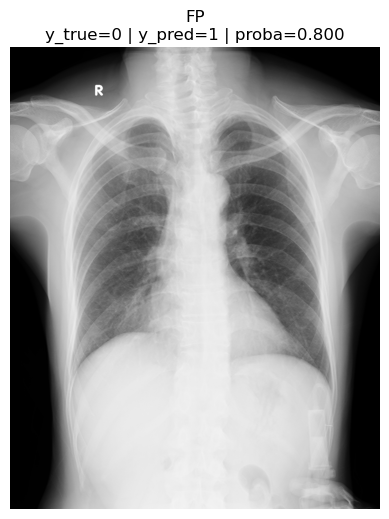

posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


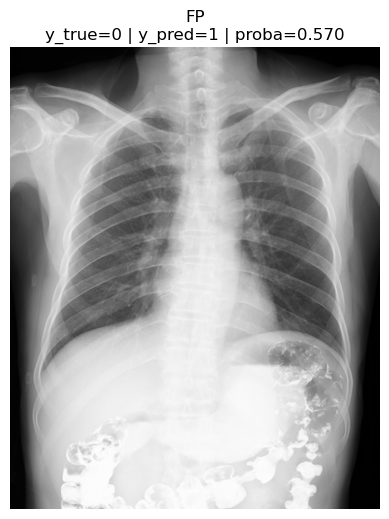

posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


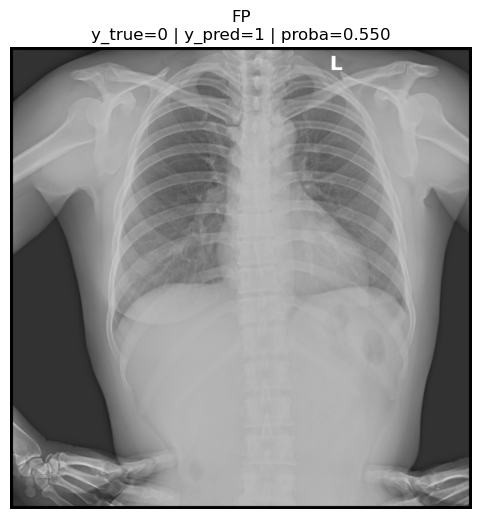

posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


=== TRUE NEGATIVES ===


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


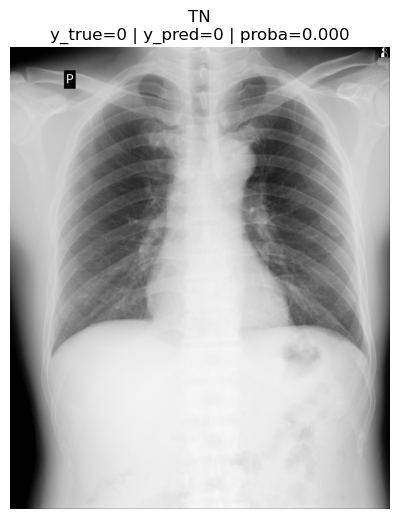

posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


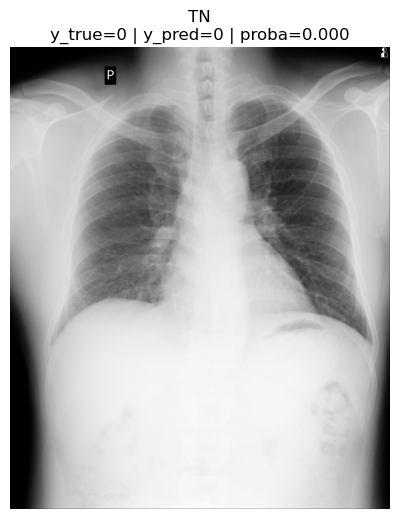

posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


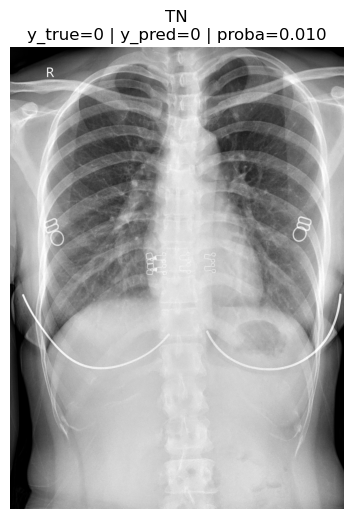

=== FALSE NEGATIVES ===


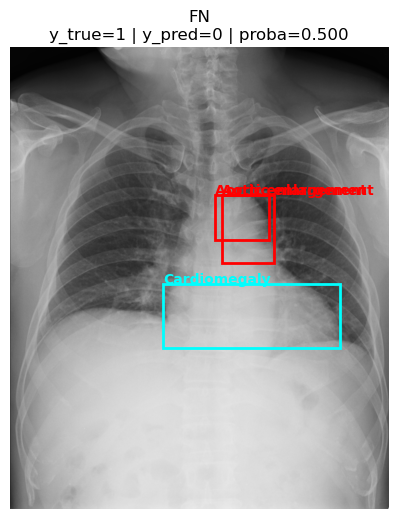

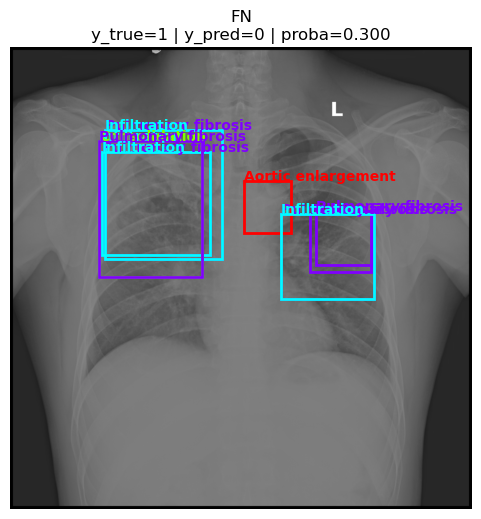

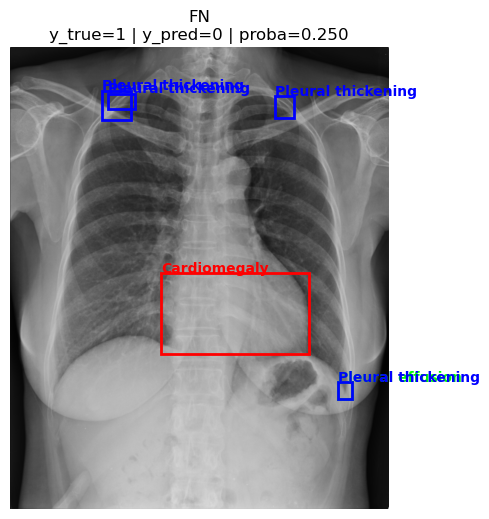

TOP 25 важнейших признаков RF:


,feature,importance
32,impl_OFFIS_DCMTK_360,0.133445
27,seat_Unknown,0.105914
28,seat_VITREA1,0.065755
33,impl_Unknown,0.054043
23,sex_Unknown,0.050195
20,age_ord,0.048297
3,max_intensity,0.017277
30,impl_INF_3.9,0.014938
2,min_intensity,0.014331
6,glcm_homogeneity,0.012789


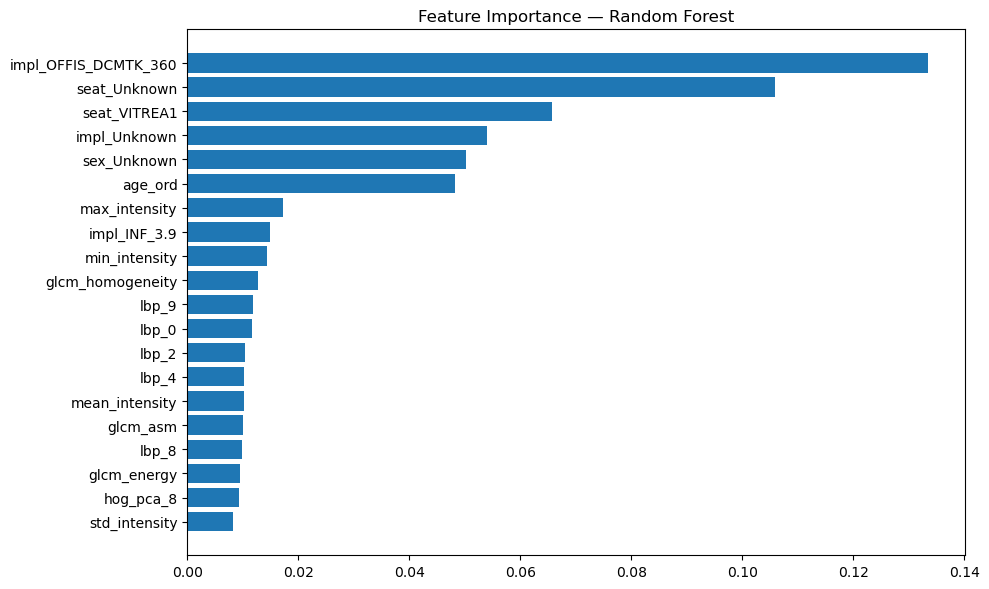

=== FN по диагнозам ===


,n_images,recall_proxy,miss_rate,avg_proba
class_name,,,,
ILD,32,0.812500,0.187500,0.703750
Other lesion,118,0.813559,0.186441,0.708390
Calcification,39,0.820513,0.179487,0.705641
Consolidation,30,0.833333,0.166667,0.724667
Pneumothorax,12,0.833333,0.166667,0.705833
Nodule/Mass,84,0.857143,0.142857,0.723452
Infiltration,65,0.861538,0.138462,0.727846
Pleural thickening,196,0.862245,0.137755,0.756276
Pulmonary fibrosis,175,0.862857,0.137143,0.733257


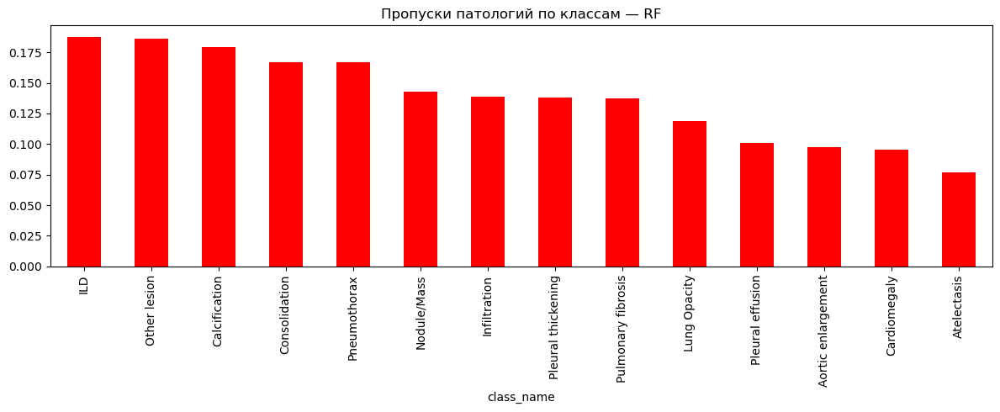


Сохранено в ./saved_baseline_rf


In [36]:
# =========================================================
# RANDOM FOREST BASELINE — ПОЛНАЯ ВЕРСИЯ (ШАГИ 1–7)
# =========================================================
# =========================================================
# 1. Загружаем датасет
# =========================================================

df = pd.read_csv("train_full_pca.csv")
print("Shape:", df.shape)

non_feature_cols = ["target_binary", "image_id"]
feature_cols = [c for c in df.columns if c not in non_feature_cols]

X = df[feature_cols].values
y = df["target_binary"].astype(int).values
image_ids = df["image_id"].astype(str)

print("Используется фич:", len(feature_cols))

# =========================================================
# 2. 80/10/10 split
# =========================================================

X_tmp, X_final, y_tmp, y_final, ids_tmp, ids_final = train_test_split(
    X, y, image_ids,
    test_size=0.10,
    random_state=42,
    stratify=y
)

X_train, X_inner, y_train, y_inner, ids_train, ids_inner = train_test_split(
    X_tmp, y_tmp, ids_tmp,
    test_size=0.1111,
    random_state=42,
    stratify=y_tmp
)

print("Train:", X_train.shape)
print("Inner:", X_inner.shape)
print("Final:", X_final.shape)

# =========================================================
# 3. Масштабирование
# =========================================================

scaler = StandardScaler()
scaler.fit(X_train)

X_train_s = scaler.transform(X_train)
X_inner_s = scaler.transform(X_inner)
X_final_s = scaler.transform(X_final)

# =========================================================
# 4. Подбор гиперпараметров RandomForest
# =========================================================

estimators = [100, 200, 400, 800]
results = []

for est in estimators:
    rf = RandomForestClassifier(
        n_estimators=est,
        max_depth=None,
        class_weight="balanced",
        n_jobs=-1,
        random_state=42
    )

    rf.fit(X_train_s, y_train)

    y_pred_inner = rf.predict(X_inner_s)
    y_proba_inner = rf.predict_proba(X_inner_s)[:, 1]

    f1  = f1_score(y_inner, y_pred_inner)
    prec = precision_score(y_inner, y_pred_inner)
    rec  = recall_score(y_inner, y_pred_inner)
    roc  = roc_auc_score(y_inner, y_proba_inner)

    results.append((est, f1, prec, rec, roc))

df_rf_inner = pd.DataFrame(
    results,
    columns=["n_estimators", "F1", "Precision", "Recall", "ROC-AUC"]
).sort_values("F1", ascending=False)

print(df_rf_inner)

best_est = int(df_rf_inner.iloc[0]["n_estimators"])
print("\nЛучшее число деревьев:", best_est)

# =========================================================
# 5. Финальное обучение
# =========================================================

X_train_full = np.vstack([X_train_s, X_inner_s])
y_train_full = np.concatenate([y_train, y_inner])
ids_train_full = pd.concat([pd.Series(ids_train), pd.Series(ids_inner)], axis=0).reset_index(drop=True)

rf_final = RandomForestClassifier(
    n_estimators=best_est,
    max_depth=None,
    class_weight="balanced",
    n_jobs=-1,
    random_state=42
)

rf_final.fit(X_train_full, y_train_full)

# =========================================================
# 6. Final hold-out evaluation
# =========================================================

y_pred_final = rf_final.predict(X_final_s)
y_proba_final = rf_final.predict_proba(X_final_s)[:, 1]

print("\n=== Final Validation (10%) ===")
f1_fin  = f1_score(y_final, y_pred_final)
prec_fin = precision_score(y_final, y_pred_final)
rec_fin  = recall_score(y_final, y_pred_final)
roc_fin  = roc_auc_score(y_final, y_proba_final)

print("F1:", f1_fin)
print("Precision:", prec_fin)
print("Recall:", rec_fin)
print("ROC-AUC:", roc_fin)

print("\nClassification report:")
print(classification_report(y_final, y_pred_final))

print("\nConfusion Matrix:")
print(confusion_matrix(y_final, y_pred_final))

# Формируем df_eval
df_eval = pd.DataFrame({
    "image_id": pd.Series(ids_final, dtype=str).reset_index(drop=True),
    "y_true":   pd.Series(y_final, dtype=int).reset_index(drop=True),
    "y_pred":   pd.Series(y_pred_final, dtype=int),
    "y_proba":  pd.Series(y_proba_final, dtype=float),
})

print("df_eval shape:", df_eval.shape)
display(df_eval.head())

# =========================================================
# 7. Визуализация примеров TP, FP, TN, FN
# =========================================================

DICOM_DIR = "/Users/mark/.cache/kagglehub/competitions/vinbigdata-chest-xray-abnormalities-detection/train"
TRAIN_CSV = os.path.join(
    "/Users/mark/.cache/kagglehub/competitions/vinbigdata-chest-xray-abnormalities-detection",
    "train.csv"
)

df_boxes = pd.read_csv(TRAIN_CSV)

def load_dicom(path):
    ds = pydicom.dcmread(path)
    img = ds.pixel_array.astype(np.float32)

    img = img * float(ds.get("RescaleSlope", 1)) + float(ds.get("RescaleIntercept", 0))
    if ds.get("PhotometricInterpretation") == "MONOCHROME1":
        img = img.max() - img

    img = img - img.min()
    img = img / img.max() if img.max() > 0 else img
    img_rgb = np.stack([img]*3, axis=-1)
    return img_rgb

def draw_boxes(ax, boxes):
    if len(boxes) == 0:
        return
    classes = sorted(boxes["class_name"].unique())
    colors = {cls: hsv_to_rgb((i/len(classes), 1, 1)) for i, cls in enumerate(classes)}
    for _, row in boxes.iterrows():
        x1, y1, x2, y2 = row["x_min"], row["y_min"], row["x_max"], row["y_max"]
        cls = row["class_name"]
        rect = patches.Rectangle((x1,y1), x2-x1, y2-y1,
                                 linewidth=2, edgecolor=colors[cls], facecolor="none")
        ax.add_patch(rect)
        ax.text(x1, y1-5, cls, color=colors[cls], fontsize=10, weight="bold")

def show_case(row, title):
    image_id = row["image_id"]
    dicom_path = os.path.join(DICOM_DIR, f"{image_id}.dicom")
    if not os.path.exists(dicom_path):
        print("Нет файла:", dicom_path)
        return

    img = load_dicom(dicom_path)

    fig, ax = plt.subplots(figsize=(6,6))
    ax.imshow(img, cmap="gray")
    ax.axis("off")

    boxes = df_boxes[df_boxes["image_id"] == image_id]
    draw_boxes(ax, boxes)

    ax.set_title(
        f"{title}\n"
        f"y_true={row['y_true']} | y_pred={row['y_pred']} | proba={row['y_proba']:.3f}",
        fontsize=12
    )
    plt.show()

tp = df_eval[(df_eval.y_true==1)&(df_eval.y_pred==1)]
fp = df_eval[(df_eval.y_true==0)&(df_eval.y_pred==1)]
tn = df_eval[(df_eval.y_true==0)&(df_eval.y_pred==0)]
fn = df_eval[(df_eval.y_true==1)&(df_eval.y_pred==0)]

def sample(df_case, n=3):
    return df_case.sample(min(n, len(df_case)), random_state=42)

print("=== TRUE POSITIVES ===")
for _, row in sample(tp).iterrows(): show_case(row, "TP")

print("=== FALSE POSITIVES ===")
for _, row in sample(fp).iterrows(): show_case(row, "FP")

print("=== TRUE NEGATIVES ===")
for _, row in sample(tn).iterrows(): show_case(row, "TN")

print("=== FALSE NEGATIVES ===")
for _, row in sample(fn).iterrows(): show_case(row, "FN")

# =========================================================
# 8. Важность признаков и ошибки по диагнозам
# =========================================================

# Feature importance
importances = rf_final.feature_importances_
df_imp = (
    pd.DataFrame({"feature": feature_cols, "importance": importances})
    .sort_values("importance", ascending=False)
)

print("TOP 25 важнейших признаков RF:")
display(df_imp.head(25))

plt.figure(figsize=(10,6))
plt.barh(df_imp.head(20)["feature"], df_imp.head(20)["importance"])
plt.gca().invert_yaxis()
plt.title("Feature Importance — Random Forest")
plt.tight_layout()
plt.show()

# Диагнозы
df_boxes_diag = (
    df_boxes[["image_id", "class_name"]]
    .drop_duplicates()
)
df_boxes_diag = df_boxes_diag[df_boxes_diag["class_name"] != "No finding"]

df_diag_eval = df_boxes_diag.merge(
    df_eval[["image_id", "y_true", "y_pred", "y_proba"]],
    on="image_id", how="inner"
)

diag_stats = (
    df_diag_eval.groupby("class_name")
    .agg(
        n_images=("image_id", "nunique"),
        recall_proxy=("y_pred", lambda x: np.mean(x==1)),
        miss_rate=("y_pred",  lambda x: np.mean(x==0)),
        avg_proba=("y_proba", "mean")
    )
    .sort_values("miss_rate", ascending=False)
)

print("=== FN по диагнозам ===")
display(diag_stats)

plt.figure(figsize=(12,5))
diag_stats["miss_rate"].plot(kind="bar", color="red")
plt.title("Пропуски патологий по классам — RF")
plt.tight_layout()
plt.show()

# =========================================================
# 9. Сохранение модели и артефактов
# =========================================================

SAVE_DIR = "./saved_baseline_rf"
os.makedirs(SAVE_DIR, exist_ok=True)

joblib.dump(rf_final, os.path.join(SAVE_DIR, "rf_model.pkl"))
joblib.dump(scaler,  os.path.join(SAVE_DIR, "scaler.pkl"))
joblib.dump(feature_cols, os.path.join(SAVE_DIR, "feature_cols.pkl"))

df_imp.to_csv(os.path.join(SAVE_DIR, "feature_importance.csv"), index=False)
diag_stats.to_csv(os.path.join(SAVE_DIR, "diag_stats.csv"))

meta = {
    "model": "RandomForestClassifier",
    "n_estimators": best_est,
    "n_features": len(feature_cols),
    "metrics_final": {
        "F1": float(f1_fin),
        "Precision": float(prec_fin),
        "Recall": float(rec_fin),
        "ROC_AUC": float(roc_fin),
    },
    "top_features": df_imp.head(25).to_dict("records"),
}

with open(os.path.join(SAVE_DIR, "meta.json"), "w") as f:
    json.dump(meta, f, indent=2)

print("\nСохранено в", SAVE_DIR)

## Модель 3. Random Forest (бинарная классификация Normal vs Abnormal)

### 1. Общее качество
Random Forest показывает стабильный, но чуть более низкий результат, чем линейные модели:

- **F1 ≈ 0.875**, precision ≈ 0.895, recall ≈ 0.856.  
- **ROC-AUC ≈ 0.975** — высокая разделяющая способность.  
- Матрица ошибок: модель немного чаще пропускает патологии (FN), чем логистическая регрессия или SVM.

RF остаётся сильным baseline, однако склонен к "усреднению" и теряет чувствительность к тонким паттернам.

---

### 2. Универсальность по классам патологий
По FN-rate модель заметно слабее на тонких диагнозах:

- **Хуже всего ловит:** ILD, Other lesion, Calcification, Consolidation, Pneumothorax — FN ~ 16–19%.  
- **Лучше всего ловит:** Atelectasis, Cardiomegaly, Aortic enlargement — FN ~ 8–10%.

То есть RF сильно фокусируется на крупных и очевидных патологиях, а subtle-находки распознаёт хуже, чем логистическая регрессия или SVM.

---

### 3. Вклад метаданных vs признаков изображения
По важности признаков RF показывает ещё более выраженный bias на метаданные:

- Топ-факторы: **impl_OFFIS_DCMTK_360, seat_Unknown, seat_VITREA1, impl_Unknown, sex_Unknown, age_ord** — суммарно дают огромную долю feature importance.  
- Это может отражать **особенности конкретной больницы или силу аппарата**, поскольку разные модели рентген-консолей применяются для разных клинических сценариев.

Признаки изображения тоже играют роль (LBP, GLCM, интенсивности, отдельные HOG-PCA), но их вклад заметно меньше, чем у метаданных.

---

### Итог
Random Forest даёт хорошую общую метрику, но:

- менее универсален по классам патологий (особенно слаб на subtle-поражениях),
- сильнее опирается на метаданные аппарата, что потенциально отражает bias конкретной клиники и ограничивает переносимость,
- хуже использует информацию изображения, чем логистическая регрессия или SVM.

Хороший baseline, но не оптимальная модель для медицинской задачи, ориентированной на универсальность и обнаружение мелких патологий.

## VII. XGBOOST

Shape: (15000, 237)
Фич в модели: 235
Train: (12000, 235)
Inner: (1500, 235)
Final: (1500, 235)
   n_estimators  max_depth    lr        F1  Precision    Recall   ROC-AUC
3           800          6  0.03  0.901149   0.909513  0.892938  0.981377
2           500          6  0.05  0.894495   0.900693  0.888383  0.981972
1           500          4  0.05  0.888120   0.899533  0.876993  0.981448
0           300          4  0.05  0.887601   0.903302  0.872437  0.980671

Лучшие параметры: {'n_estimators': 800.0, 'max_depth': 6.0, 'lr': 0.03}

=== Final Validation (10%) ===
F1: 0.8947976878612717
Precision: 0.9084507042253521
Recall: 0.8815489749430524
ROC-AUC: 0.9837970367921267

Classification report:
              precision    recall  f1-score   support

           0       0.95      0.96      0.96      1061
           1       0.91      0.88      0.89       439

    accuracy                           0.94      1500
   macro avg       0.93      0.92      0.93      1500
weighted avg       0.94  

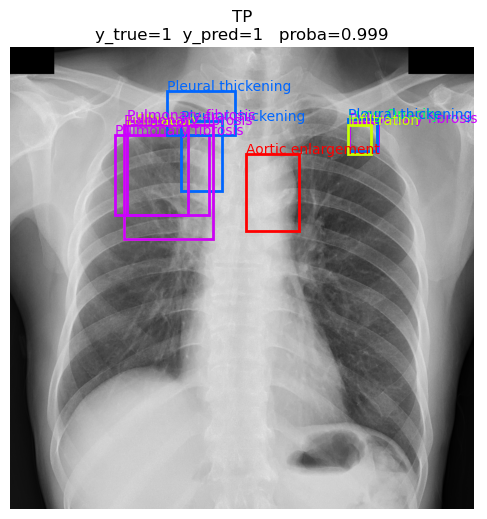

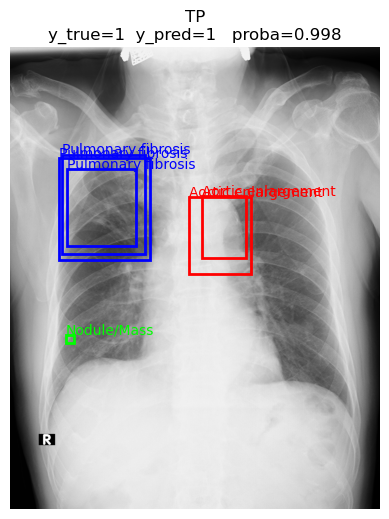

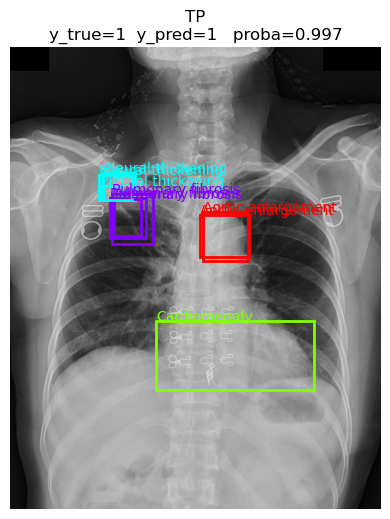

=== FALSE POSITIVES ===


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


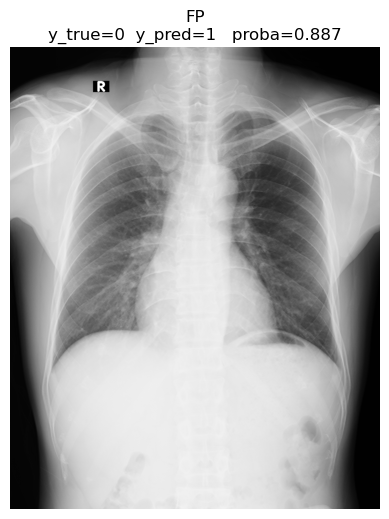

posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


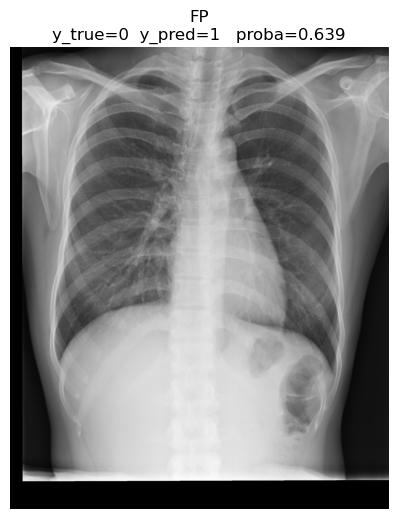

posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


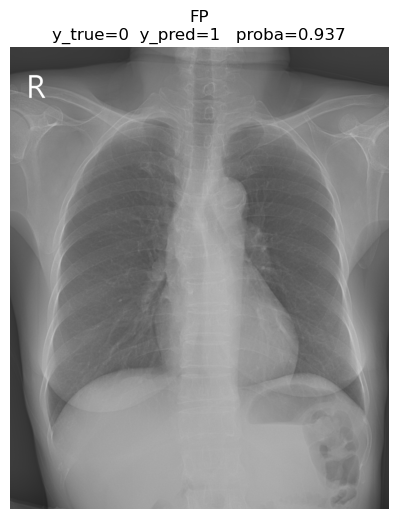

=== TRUE NEGATIVES ===


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


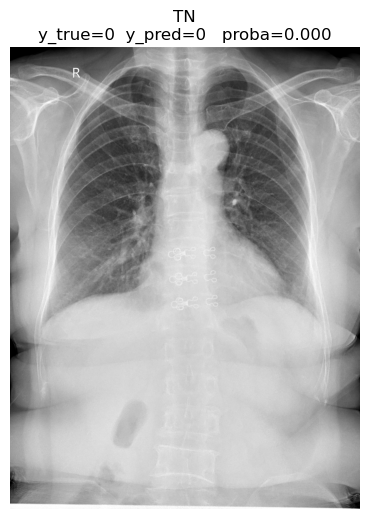

posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


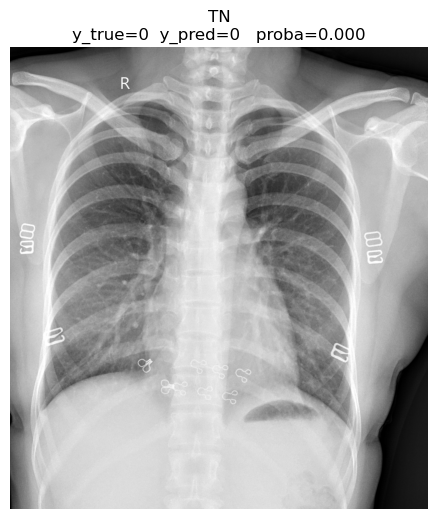

posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


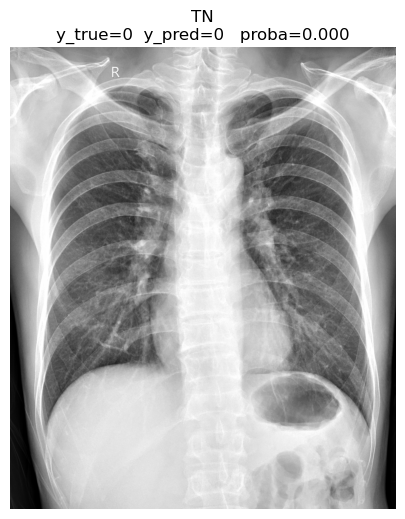

=== FALSE NEGATIVES ===


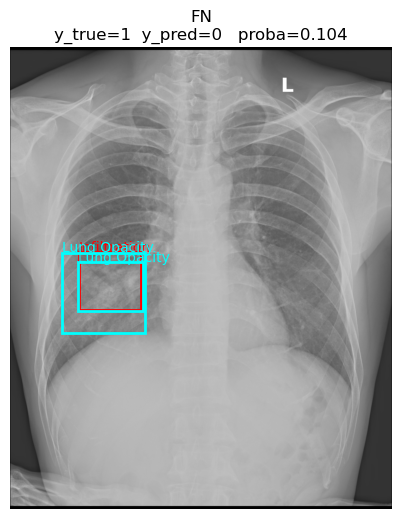

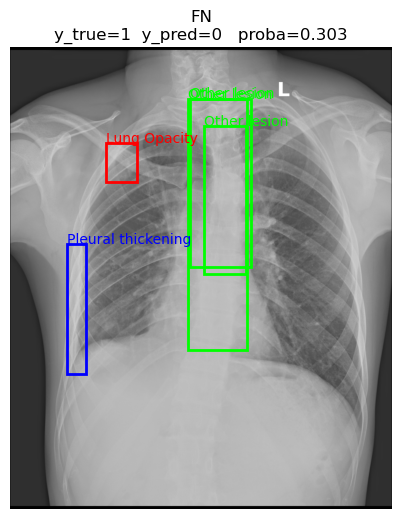

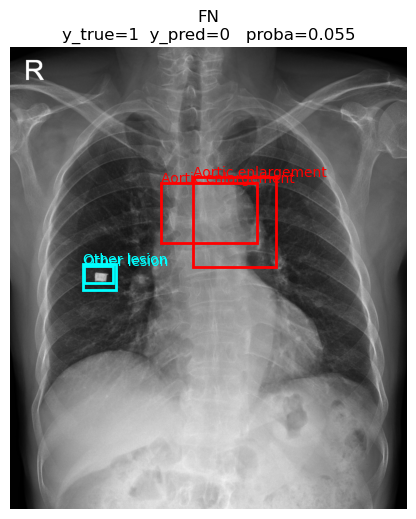

ТОП 25 признаков XGB:


,feature,importance
27,seat_Unknown,0.143217
32,impl_OFFIS_DCMTK_360,0.137206
23,sex_Unknown,0.120570
33,impl_Unknown,0.082216
30,impl_INF_3.9,0.049416
28,seat_VITREA1,0.036183
20,age_ord,0.018527
2,min_intensity,0.013712
1,std_intensity,0.010992
8,glcm_correlation,0.008896


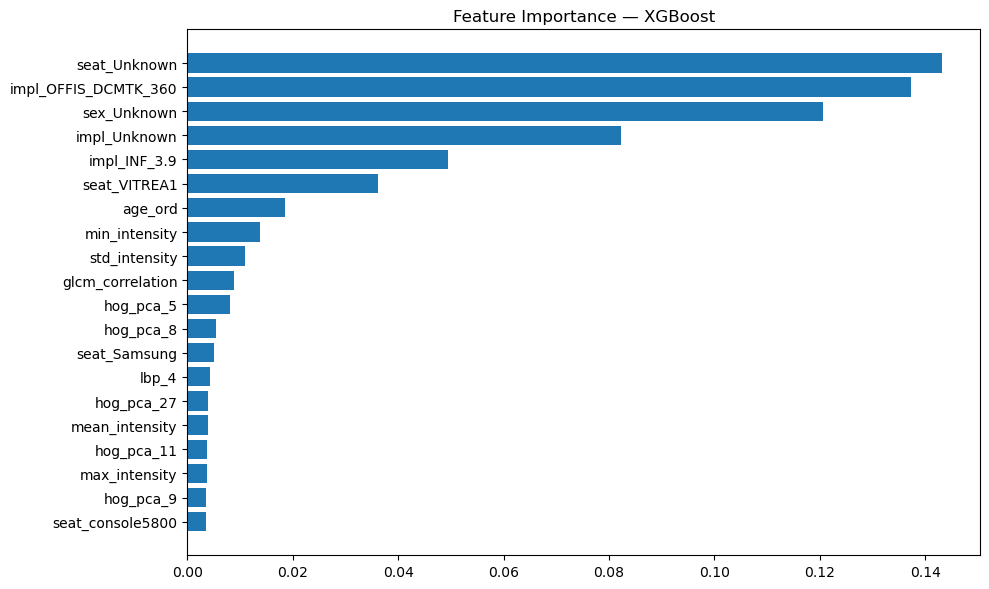

=== Ошибки по классам (FN rate) ===


,n_images,recall_proxy,miss_rate,avg_proba
class_name,,,,
Pneumothorax,12,0.833333,0.166667,0.859065
Infiltration,65,0.861538,0.138462,0.833020
Consolidation,30,0.866667,0.133333,0.867278
Other lesion,118,0.872881,0.127119,0.857201
ILD,32,0.875000,0.125000,0.851400
Nodule/Mass,84,0.880952,0.119048,0.846062
Pulmonary fibrosis,175,0.897143,0.102857,0.860868
Calcification,39,0.897436,0.102564,0.852747
Lung Opacity,118,0.898305,0.101695,0.877804


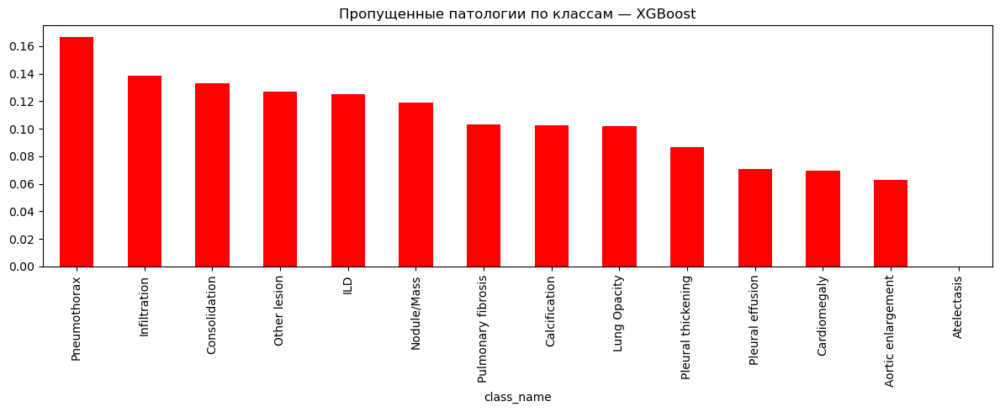


Сохранено в ./saved_baseline_xgb


In [39]:
# =========================================================
# 1. Загружаем датасет (после PCA и кодирования)
# =========================================================

df = pd.read_csv("train_full_pca.csv")
print("Shape:", df.shape)

non_feature_cols = ["target_binary", "image_id"]
feature_cols = [c for c in df.columns if c not in non_feature_cols]

X = df[feature_cols].values
y = df["target_binary"].astype(int).values
image_ids = df["image_id"].astype(str)

print("Фич в модели:", len(feature_cols))

# =========================================================
# 2. 80/10/10 split
# =========================================================

X_tmp, X_final, y_tmp, y_final, ids_tmp, ids_final = train_test_split(
    X, y, image_ids,
    test_size=0.10,
    random_state=42,
    stratify=y
)

X_train, X_inner, y_train, y_inner, ids_train, ids_inner = train_test_split(
    X_tmp, y_tmp, ids_tmp,
    test_size=0.1111,  # 10% от общей выборки
    random_state=42,
    stratify=y_tmp
)

print("Train:", X_train.shape)
print("Inner:", X_inner.shape)
print("Final:", X_final.shape)

# =========================================================
# 3. Масштабирование
# =========================================================

scaler = StandardScaler()
scaler.fit(X_train)

X_train_s = scaler.transform(X_train)
X_inner_s = scaler.transform(X_inner)
X_final_s = scaler.transform(X_final)

# =========================================================
# 4. Подбор гиперпараметров XGBoost
# =========================================================

params_grid = [
    {"n_estimators": 300, "max_depth": 4, "learning_rate": 0.05},
    {"n_estimators": 500, "max_depth": 4, "learning_rate": 0.05},
    {"n_estimators": 500, "max_depth": 6, "learning_rate": 0.05},
    {"n_estimators": 800, "max_depth": 6, "learning_rate": 0.03},
]

results = []

for p in params_grid:
    model = XGBClassifier(
        n_estimators=p["n_estimators"],
        max_depth=p["max_depth"],
        learning_rate=p["learning_rate"],
        subsample=0.8,
        colsample_bytree=0.8,
        objective="binary:logistic",
        eval_metric="logloss",
        n_jobs=-1,
        random_state=42,
        tree_method="hist"
    )

    model.fit(X_train_s, y_train)

    y_pred_inner = model.predict(X_inner_s)
    y_proba_inner = model.predict_proba(X_inner_s)[:, 1]

    f1  = f1_score(y_inner, y_pred_inner)
    prec = precision_score(y_inner, y_pred_inner)
    rec  = recall_score(y_inner, y_pred_inner)
    roc  = roc_auc_score(y_inner, y_proba_inner)

    results.append((p, f1, prec, rec, roc))

df_xgb_inner = pd.DataFrame(
    [(r[0]["n_estimators"], r[0]["max_depth"], r[0]["learning_rate"], r[1], r[2], r[3], r[4])
     for r in results],
    columns=["n_estimators", "max_depth", "lr", "F1", "Precision", "Recall", "ROC-AUC"]
).sort_values("F1", ascending=False)

print(df_xgb_inner)

best_params = df_xgb_inner.iloc[0][["n_estimators", "max_depth", "lr"]].to_dict()
print("\nЛучшие параметры:", best_params)

# =========================================================
# 5. Финальное обучение XGBoost
# =========================================================

X_train_full = np.vstack([X_train_s, X_inner_s])
y_train_full = np.concatenate([y_train, y_inner])

xgb_final = XGBClassifier(
    n_estimators=int(best_params["n_estimators"]),
    max_depth=int(best_params["max_depth"]),
    learning_rate=float(best_params["lr"]),
    subsample=0.8,
    colsample_bytree=0.8,
    objective="binary:logistic",
    eval_metric="logloss",
    n_jobs=-1,
    random_state=42,
    tree_method="hist"
)

xgb_final.fit(X_train_full, y_train_full)

# =========================================================
# 6. Оценка на final hold-out (10%)
# =========================================================

y_pred_final = xgb_final.predict(X_final_s)
y_proba_final = xgb_final.predict_proba(X_final_s)[:, 1]

f1_fin  = f1_score(y_final, y_pred_final)
prec_fin = precision_score(y_final, y_pred_final)
rec_fin  = recall_score(y_final, y_pred_final)
roc_fin  = roc_auc_score(y_final, y_proba_final)

print("\n=== Final Validation (10%) ===")
print("F1:", f1_fin)
print("Precision:", prec_fin)
print("Recall:", rec_fin)
print("ROC-AUC:", roc_fin)

print("\nClassification report:")
print(classification_report(y_final, y_pred_final))

print("\nConfusion Matrix:")
print(confusion_matrix(y_final, y_pred_final))

df_eval = pd.DataFrame({
    "image_id": ids_final,
    "y_true": y_final,
    "y_pred": y_pred_final,
    "y_proba": y_proba_final
})

# =========================================================
# 7. Визуализация TP / FP / TN / FN с боксами
# =========================================================

DICOM_DIR = "/Users/mark/.cache/kagglehub/competitions/vinbigdata-chest-xray-abnormalities-detection/train"
TRAIN_CSV = "/Users/mark/.cache/kagglehub/competitions/vinbigdata-chest-xray-abnormalities-detection/train.csv"
df_boxes = pd.read_csv(TRAIN_CSV)

def load_dicom(path):
    ds = pydicom.dcmread(path)
    img = ds.pixel_array.astype(np.float32)
    img = img * float(ds.get("RescaleSlope", 1)) + float(ds.get("RescaleIntercept", 0))
    if ds.get("PhotometricInterpretation") == "MONOCHROME1":
        img = img.max() - img
    img = img - img.min()
    img = img / img.max() if img.max() > 0 else img
    return np.stack([img]*3, axis=-1)

def draw_boxes(ax, boxes):
    if len(boxes) == 0: return
    classes = sorted(boxes["class_name"].unique())
    colors = {cls: hsv_to_rgb((i/len(classes),1,1)) for i,cls in enumerate(classes)}
    for _, row in boxes.iterrows():
        rect = patches.Rectangle(
            (row["x_min"], row["y_min"]),
            row["x_max"] - row["x_min"],
            row["y_max"] - row["y_min"],
            edgecolor=colors[row["class_name"]],
            facecolor="none", linewidth=2
        )
        ax.add_patch(rect)
        ax.text(row["x_min"], row["y_min"]-5, row["class_name"],
                color=colors[row["class_name"]], fontsize=10)

def show_case(row, title):
    image_id = row["image_id"]
    path = os.path.join(DICOM_DIR, f"{image_id}.dicom")
    if not os.path.exists(path): 
        print("Нет файла:", path)
        return
    img = load_dicom(path)
    fig, ax = plt.subplots(figsize=(6,6))
    ax.imshow(img, cmap="gray")
    ax.axis("off")
    draw_boxes(ax, df_boxes[df_boxes["image_id"] == image_id])
    ax.set_title(f"{title}\ny_true={row['y_true']}  y_pred={row['y_pred']}   proba={row['y_proba']:.3f}")
    plt.show()

tp = df_eval[(df_eval.y_true==1)&(df_eval.y_pred==1)]
fp = df_eval[(df_eval.y_true==0)&(df_eval.y_pred==1)]
tn = df_eval[(df_eval.y_true==0)&(df_eval.y_pred==0)]
fn = df_eval[(df_eval.y_true==1)&(df_eval.y_pred==0)]

def sample(df_case, n=3):
    return df_case.sample(min(n, len(df_case)), random_state=42)

print("=== TRUE POSITIVES ===")
for _, row in sample(tp).iterrows(): show_case(row, "TP")

print("=== FALSE POSITIVES ===")
for _, row in sample(fp).iterrows(): show_case(row, "FP")

print("=== TRUE NEGATIVES ===")
for _, row in sample(tn).iterrows(): show_case(row, "TN")

print("=== FALSE NEGATIVES ===")
for _, row in sample(fn).iterrows(): show_case(row, "FN")

# =========================================================
# 8. Важность признаков + ошибки по диагнозам
# =========================================================

df_imp = (
    pd.DataFrame({
        "feature": feature_cols,
        "importance": xgb_final.feature_importances_
    })
    .sort_values("importance", ascending=False)
)

print("ТОП 25 признаков XGB:")
display(df_imp.head(25))

plt.figure(figsize=(10,6))
plt.barh(df_imp.head(20)["feature"], df_imp.head(20)["importance"])
plt.gca().invert_yaxis()
plt.title("Feature Importance — XGBoost")
plt.tight_layout()
plt.show()

# ошибки по классам
df_boxes_diag = df_boxes.drop_duplicates(subset=["image_id", "class_name"])
df_boxes_diag = df_boxes_diag[df_boxes_diag["class_name"] != "No finding"]

df_diag_eval = df_boxes_diag.merge(df_eval, on="image_id", how="inner")

diag_stats = (
    df_diag_eval.groupby("class_name")
    .agg(
        n_images=("image_id","nunique"),
        recall_proxy=("y_pred", lambda x: np.mean(x==1)),
        miss_rate=("y_pred", lambda x: np.mean(x==0)),
        avg_proba=("y_proba", "mean")
    )
    .sort_values("miss_rate", ascending=False)
)

print("=== Ошибки по классам (FN rate) ===")
display(diag_stats)

plt.figure(figsize=(12,5))
diag_stats["miss_rate"].plot(kind="bar", color="red")
plt.title("Пропущенные патологии по классам — XGBoost")
plt.tight_layout()
plt.show()

# =========================================================
# 9. Сохранение модели
# =========================================================

SAVE_DIR = "./saved_baseline_xgb"
os.makedirs(SAVE_DIR, exist_ok=True)

joblib.dump(xgb_final, os.path.join(SAVE_DIR, "xgb_model.pkl"))
joblib.dump(scaler,     os.path.join(SAVE_DIR, "scaler.pkl"))
joblib.dump(feature_cols, os.path.join(SAVE_DIR, "feature_cols.pkl"))

df_imp.to_csv(os.path.join(SAVE_DIR, "feature_importance.csv"), index=False)
diag_stats.to_csv(os.path.join(SAVE_DIR, "diag_stats.csv"))

meta = {
    "model": "XGBoost",
    "params": best_params,
    "n_features": len(feature_cols),
    "metrics_final": {
        "F1": float(f1_fin),
        "Precision": float(prec_fin),
        "Recall": float(rec_fin),
        "ROC_AUC": float(roc_fin),
    },
    "top_features": df_imp.head(25).to_dict("records"),
}

with open(os.path.join(SAVE_DIR, "meta.json"), "w") as f:
    json.dump(meta, f, indent=2)

print("\nСохранено в", SAVE_DIR)

## Модель 4. XGBoost (бинарная Normal vs Abnormal)

**1. Общее качество**

- Разбиение 80/10/10, подбор `n_estimators / max_depth / lr` по inner.
- Лучшие параметры: `n_estimators ≈ 800`, `max_depth = 6`, `lr ≈ 0.03`. 
- Итог на hold-out 10%:
  - F1 ≈ **0.895**
  - Precision ≈ **0.91** (ложная тревога — примерно каждый 11-й «abnormal»)
  - Recall ≈ **0.88** (теряем ~12% патологий)
  - ROC-AUC ≈ **0.984**
- Матрица ошибок:  
  - TN = 1022, FP = 39  
  - FN = 52, TP = 387  

Модель даёт самое высокое F1 среди всех базовых моделей при очень высоком ROC-AUC — сильный «табличный» буст по сравнению с логрегом и RF.

---

**2. Универсальность по классам**

По FN-rate по классам:

- Чаще всего пропускаются: Pneumothorax, Infiltration, Consolidation, Other lesion, ILD (FN ~12–17%).
- Лучше всего детектируются крупные/контрастные патологии: Atelectasis (0% FN), Aortic enlargement, Cardiomegaly, Pleural effusion (FN < 7–8%).

Картина похожа на логрег/SVM: XGBoost лучше всего видит выразительные, «грубые» изменения и сложнее справляется с более subtle сущностями.

---

**3. Метаданные vs признаки изображения**

По топ-фичам XGBoost:

- Вершина списка — **метаданные аппарата/протокола**: `seat_Unknown`, `seat_VITREA1`, `seat_Samsung`, `seat_console5800`, `impl_OFFIS_DCMTK_360`, `impl_Unknown`, `impl_INF_3.9`, а также `sex_Unknown`, `age_ord`.  
  Эти поля, скорее всего, кодируют конкретную больницу, тип консоли и/или класс/мощность аппарата, который применяется только для определённых клинических сценариев. Модель может частично «угадывать» диагноз по тому, где и на каком железе снимок сделан.
- Из изображения в топе: интенсивности (`min/mean/std/max_intensity`), текстурные признаки (`glcm_correlation`, `lbp_3/4`), PCA-компоненты HOG (`hog_pca_0/3/5/6/8/9/11/12/27` и др.).

Итого:

- XGBoost лучше всего использует смесь табличных метаданных и визуальных признаков, но вклад аппаратных/протокольных полей остаётся очень высоким.
- Это даёт максимум качества на текущем датасете, но усиливает риск **переобучения на конкретные клиники/оборудование**.
- Для более универсальной системы имеет смысл:
  - либо ослаблять/ограничивать аппаратные метаданные,
  - либо отдельно мерить качество модели «только по картинке» vs «картинка + мета», чтобы не допустить ситуации, когда модель почти целиком держится на hospital / scanner bias.